# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [0]:
# !rm data/celeba.zip
# tf.reset_default_graph()

In [0]:
import math
import os

import hashlib
from urllib.request import urlretrieve
import zipfile
import gzip
import shutil

import numpy as np
from PIL import Image
from tqdm import tqdm

from copy import deepcopy
from unittest import mock

from distutils.version import LooseVersion
import warnings

import tensorflow as tf

from glob import glob
from matplotlib import pyplot
from matplotlib import cm

def _read32(bytestream):
    """Read 32-bit integer from bytesteam
       :param bytestream: A bytestream
       :return: 32-bit integer"""
    dt = np.dtype(np.uint32).newbyteorder('>')
    return np.frombuffer(bytestream.read(4), dtype=dt)[0]

def _unzip(save_path, _, database_name, data_path):
    """Unzip wrapper with the same interface as _ungzip
       :param save_path: The path of the gzip files
       :param database_name: Name of database
       :param data_path: Path to extract to
       :param _: HACK - Used to have to same interface as _ungzip"""
    print('Extracting {}...'.format(database_name))
    with zipfile.ZipFile(save_path) as zf:
        zf.extractall(data_path)

def _ungzip(save_path, extract_path, database_name, _):
    """Unzip a gzip file and extract it to extract_path
       :param save_path: The path of the gzip files
       :param extract_path: The location to extract the data to
       :param database_name: Name of database
       :param _: HACK - Used to have to same interface as _unzip"""
    # Get data from save_path
    with open(save_path, 'rb') as f:
        with gzip.GzipFile(fileobj=f) as bytestream:
            magic = _read32(bytestream)
            if magic != 2051:
                raise ValueError('Invalid magic number {} in file: {}'.format(magic, f.name))
            num_images = _read32(bytestream)
            rows = _read32(bytestream)
            cols = _read32(bytestream)
            buf = bytestream.read(rows * cols * num_images)
            data = np.frombuffer(buf, dtype=np.uint8)
            data = data.reshape(num_images, rows, cols)

    # Save data to extract_path
    for image_i, image in enumerate(
            tqdm(data, unit='File', unit_scale=True, miniters=1, desc='Extracting {}'.format(database_name))):
        Image.fromarray(image, 'L').save(os.path.join(extract_path, 'image_{}.jpg'.format(image_i)))  
        
def get_image(image_path, width, height, mode):
    """Read image from image_path
       :param image_path: Path of image
       :param width: Width of image
       :param height: Height of image
       :param mode: Mode of image
       :return: Image data"""
    image = Image.open(image_path)

    if image.size != (width, height):  # HACK - Check if image is from the CELEBA dataset
        # Remove most pixels that aren't part of a face
        face_width = face_height = 108
        j = (image.size[0] - face_width) // 2
        i = (image.size[1] - face_height) // 2
        image = image.crop([j, i, j + face_width, i + face_height])
        image = image.resize([width, height], Image.BILINEAR)

    return np.array(image.convert(mode))

def get_batch(image_files, width, height, mode):
    data_batch = np.array(
        [get_image(sample_file, width, height, mode) for sample_file in image_files]).astype(np.float32)

    # Make sure the images are in 4 dimensions
    if len(data_batch.shape) < 4:
        data_batch = data_batch.reshape(data_batch.shape + (1,))

    return data_batch
  
def images_square_grid(images, mode):
    """Save images as a square grid
       :param images: Images to be used for the grid
       :param mode: The mode to use for images
       :return: Image of images in a square grid"""
    # Get maximum size for square grid of images
    save_size = math.floor(np.sqrt(images.shape[0]))

    # Scale to 0-255
    images = (((images - images.min()) * 255) / (images.max() - images.min())).astype(np.uint8)

    # Put images in a square arrangement
    images_in_square = np.reshape(
            images[:save_size*save_size],
            (save_size, save_size, images.shape[1], images.shape[2], images.shape[3]))
    if mode == 'L':
        images_in_square = np.squeeze(images_in_square, 4)

    # Combine images to grid image
    new_im = Image.new(mode, (images.shape[1] * save_size, images.shape[2] * save_size))
    for col_i, col_images in enumerate(images_in_square):
        for image_i, image in enumerate(col_images):
            im = Image.fromarray(image, mode)
            new_im.paste(im, (col_i * images.shape[1], image_i * images.shape[2]))

    return new_im
  
def download_extract(database_name, data_path):
    """Download and extract database
       :param database_name: Database name"""
    DATASET_CELEBA_NAME = 'celeba'
    DATASET_MNIST_NAME = 'mnist'

    if database_name == DATASET_CELEBA_NAME:
        url = 'https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip'
        hash_code = '00d2c5bc6d35e252742224ab0c1e8fcb'
        extract_path = os.path.join(data_path, 'img_align_celeba')
        save_path = os.path.join(data_path, 'celeba.zip')
        extract_fn = _unzip
    elif database_name == DATASET_MNIST_NAME:
        url = 'http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz'
        hash_code = 'f68b3c2dcbeaaa9fbdd348bbdeb94873'
        extract_path = os.path.join(data_path, 'mnist')
        save_path = os.path.join(data_path, 'train-images-idx3-ubyte.gz')
        extract_fn = _ungzip

    if os.path.exists(extract_path):
        print('Found {} Data'.format(database_name))
        return

    if not os.path.exists(data_path):
        os.makedirs(data_path)

    if not os.path.exists(save_path):
        with DLProgress(unit='B', unit_scale=True, miniters=1, desc='Downloading {}'.format(database_name)) as pbar:
            urlretrieve(
                url,
                save_path,
                pbar.hook)

    assert hashlib.md5(open(save_path, 'rb').read()).hexdigest() == hash_code, \
        '{} file is corrupted.  Remove the file and try again.'.format(save_path)

    os.makedirs(extract_path)
    try:
        extract_fn(save_path, extract_path, database_name, data_path)
    except Exception as err:
        shutil.rmtree(extract_path)  # Remove extraction folder if there is an error
        raise err

    # Remove compressed data
    os.remove(save_path)
    
class Dataset(object):
    def __init__(self, dataset_name, data_files):
        """Initalize the class
           :param dataset_name: Database name
           :param data_files: List of files in the database"""
        DATASET_CELEBA_NAME = 'celeba'
        DATASET_MNIST_NAME = 'mnist'
        IMAGE_WIDTH = 28
        IMAGE_HEIGHT = 28

        if dataset_name == DATASET_CELEBA_NAME:
            self.image_mode = 'RGB'
            image_channels = 3

        elif dataset_name == DATASET_MNIST_NAME:
            self.image_mode = 'L'
            image_channels = 1

        self.data_files = data_files
        self.shape = len(data_files), IMAGE_WIDTH, IMAGE_HEIGHT, image_channels

    def get_batches(self, batch_size):
        """Generate batches
          :param batch_size: Batch Size
          :return: Batches of data"""
        IMAGE_MAX_VALUE = 255

        current_index = 0
        while current_index + batch_size <= self.shape[0]:
            data_batch = get_batch(
                self.data_files[current_index:current_index + batch_size],
                *self.shape[1:3],
                self.image_mode)

            current_index += batch_size

            yield data_batch / IMAGE_MAX_VALUE - 0.5
            
class DLProgress(tqdm):
    """Handle Progress Bar while Downloading"""
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        """A hook function that will be called once on establishment of the network connection 
           and once after each block read thereafter.
           :param block_num: A count of blocks transferred so far
           :param block_size: Block size in bytes
           :param total_size: The total size of the file. This may be -1 on older FTP servers 
                              which do not return a file size in response to a retrieval request."""
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

In [15]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

download_extract('mnist', data_dir)
download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

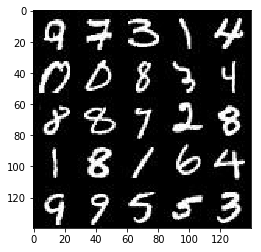

In [6]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

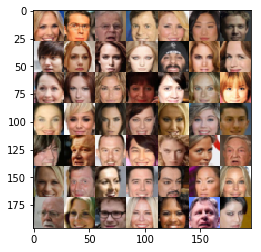

In [7]:
show_n_images = 50

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [9]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.13.1
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [30]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, 
                                shape=[None, image_width, image_height, image_channels],
                                name="Real_Input")
    input_z = tf.placeholder(tf.float32, 
                                shape=[None, z_dim],
                                name="Z_Input") 
    input_lr = tf.placeholder(tf.float32, 
                                shape=[],
                                name="Learning_Rate") 
    return input_real, input_z, input_lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [31]:
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, 
                              padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))
        relu1 = tf.maximum(alpha * x1, x1)
        print ('L1:',relu1.shape)

        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, 
                              padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        print ('L2:',relu2.shape)

        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, 
                              padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        print ('L3:',relu3.shape)
        
        x4 = tf.layers.conv2d(relu3, 512, 5, strides=2, 
                              padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))
        bn4 = tf.layers.batch_normalization(x4, training=True)
        print ('L4:',bn4.shape)

        # Flatten it
        flat = tf.reshape(bn4, (-1, 2*2*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        print ('L5:',out.shape)

    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [32]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, training=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        bn1 = tf.layers.batch_normalization(x1, training=training)
        # leaky_relu activation
        relu1 = tf.nn.leaky_relu(bn1,alpha=0.2,name='relu1')

        print ('\nDL1:',relu1.shape)

        x2 = tf.layers.conv2d_transpose(relu1, 256, 5, strides=2, 
                                        padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))
        bn2 = tf.layers.batch_normalization(x2, training=training)
        # leaky_relu activation
        relu2 = tf.nn.leaky_relu(bn2,alpha=0.2,name='relu2')
        
        print ('DL2:',relu2.shape)
            
        x3 = tf.layers.conv2d_transpose(relu2, 128, 5, strides=2, 
                                        padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))
        bn3 = tf.layers.batch_normalization(x3, training=training)
        # leaky_relu activation
        relu3 = tf.nn.leaky_relu(bn3,alpha=0.2,name='relu3')

        print ('DL3:',relu3.shape)

        # Output layer
        logits = tf.layers.conv2d_transpose(relu3, out_channel_dim, 1, strides=1, 
                                            padding='same', kernel_initializer=tf.random_normal_initializer(stddev=0.1))

        print ('DL4:',logits.shape)        
        
        out = tf.tanh(logits)
    return out
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)


DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 128)
DL4: (?, 28, 28, 5)

DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 128)
DL4: (?, 28, 28, 5)
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [33]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_labels_real = tf.ones_like(d_model_real)
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                labels=d_labels_real))

    d_labels_fake = tf.zeros_like(d_model_fake)
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                                        labels=d_labels_fake))
    
    g_labels = tf.ones_like(d_model_fake)
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, 
                                                labels=g_labels))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)


DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 128)
DL4: (?, 28, 28, 4)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [34]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [0]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [0]:
class GAN:
    def __init__(self, real_size, z_dim, learning_rate, alpha=0.2, beta1=0.5):

        self.input_real, self.input_z, self.learning_rate = model_inputs(*real_size, 
                                                                         z_dim)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                                      real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, 
                                           learning_rate, beta1)



In [0]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, train_step=0, alpha = 0.2):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    train_step = 0
    DTL, GTL = [], []
    # Create the network
    net = GAN(data_shape[1:], z_dim, learning_rate, alpha=alpha, beta1=beta1)
    print_step = 50
    show_step = 500
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                train_step += 1
                batch_images *= 2.0                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(net.d_opt, 
                             feed_dict={net.input_real: batch_images, net.input_z: batch_z})
                _ = sess.run(net.g_opt, 
                             feed_dict={net.input_z: batch_z, net.input_real: batch_images})

                if train_step % print_step == 0:
                    discriminator_training_loss = net.d_loss.eval({net.input_real: batch_images, 
                                                                   net.input_z: batch_z})
                    generator_training_loss = net.g_loss.eval({net.input_z: batch_z,
                                                              net.input_real: batch_images})

                    print("Epoch {}/{}| Step {}|".format(epoch_i + 1, epochs, train_step),
                          "Discriminator Loss:{:.5f}|".format(discriminator_training_loss),
                          "Generator Loss:{:.5f}|".format(generator_training_loss),
                          "Discriminator Loss>Generator Loss: {}"\
                          .format(discriminator_training_loss > generator_training_loss))
                    
                    DTL.append(discriminator_training_loss) 
                    GTL.append(generator_training_loss) 
                    
                if train_step % show_step == 0:
                    show_generator_output(sess, 28, net.input_z, data_shape[3], data_image_mode)
                    
        show_generator_output(sess, 28, net.input_z, data_shape[3], data_image_mode)
        
    pyplot.figure(figsize=(18, 6))
    pyplot.plot(DTL, label = 'discriminator')
    pyplot.plot(GTL, label = 'generator')
    pyplot.legend()
    pyplot.title('Loss Function');
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.


DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 128)
DL4: (?, 28, 28, 1)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
Epoch 1/25| Step 50| Discriminator Loss:0.50208| Generator Loss:12.77398| Discriminator Loss>Generator Loss: False
Epoch 1/25| Step 100| Discriminator Loss:1.65748| Generator Loss:0.44912| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 150| Discriminator Loss:1.28680| Generator Loss:1.32677| Discriminator Loss>Generator Loss: False
Epoch 1/25| Step 200| Discriminator Loss:1.38144| Generator Loss:0.39361| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 250| Discriminator Loss:1.10408| Generator Loss:0.57143| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 300| Discriminator Loss:1.10593| Generator Loss:1.44764| Discriminator Loss>Generator Loss: False
Epoch 1/25| Step 350| Discriminator Loss:1.17191| Ge

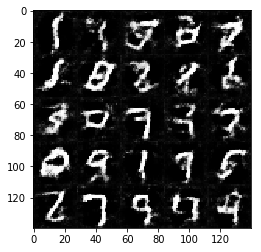

Epoch 1/25| Step 550| Discriminator Loss:1.14403| Generator Loss:2.26527| Discriminator Loss>Generator Loss: False
Epoch 1/25| Step 600| Discriminator Loss:1.28109| Generator Loss:0.48434| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 650| Discriminator Loss:1.86044| Generator Loss:0.23403| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 700| Discriminator Loss:1.09914| Generator Loss:0.53206| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 750| Discriminator Loss:1.50224| Generator Loss:0.34164| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 800| Discriminator Loss:1.61584| Generator Loss:0.27157| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 850| Discriminator Loss:2.84781| Generator Loss:0.07667| Discriminator Loss>Generator Loss: True
Epoch 1/25| Step 900| Discriminator Loss:0.81449| Generator Loss:0.68416| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 950| Discriminator Loss:1.35132| Generator Loss:0.39967| Discriminator

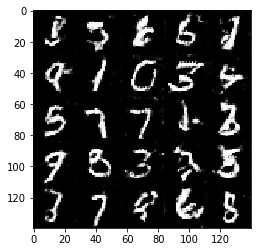

Epoch 2/25| Step 1050| Discriminator Loss:0.70310| Generator Loss:1.83482| Discriminator Loss>Generator Loss: False
Epoch 2/25| Step 1100| Discriminator Loss:0.97791| Generator Loss:1.03689| Discriminator Loss>Generator Loss: False
Epoch 2/25| Step 1150| Discriminator Loss:1.38768| Generator Loss:0.37160| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1200| Discriminator Loss:1.36735| Generator Loss:0.35138| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1250| Discriminator Loss:1.90300| Generator Loss:0.21275| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1300| Discriminator Loss:1.20420| Generator Loss:0.51321| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1350| Discriminator Loss:1.49979| Generator Loss:0.30047| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1400| Discriminator Loss:1.36646| Generator Loss:0.38867| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1450| Discriminator Loss:3.80148| Generator Loss:0.05961| Dis

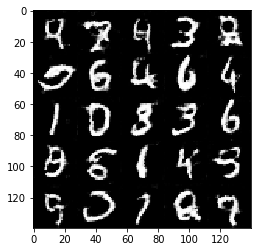

Epoch 2/25| Step 1550| Discriminator Loss:1.16075| Generator Loss:0.46141| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1600| Discriminator Loss:1.48808| Generator Loss:0.31177| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1650| Discriminator Loss:2.01443| Generator Loss:0.16845| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1700| Discriminator Loss:0.91048| Generator Loss:0.65859| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1750| Discriminator Loss:1.80440| Generator Loss:0.32349| Discriminator Loss>Generator Loss: True
Epoch 2/25| Step 1800| Discriminator Loss:0.72293| Generator Loss:1.30179| Discriminator Loss>Generator Loss: False
Epoch 2/25| Step 1850| Discriminator Loss:1.38531| Generator Loss:0.36564| Discriminator Loss>Generator Loss: True
Epoch 3/25| Step 1900| Discriminator Loss:0.92353| Generator Loss:0.81584| Discriminator Loss>Generator Loss: True
Epoch 3/25| Step 1950| Discriminator Loss:1.82928| Generator Loss:0.89236| Disc

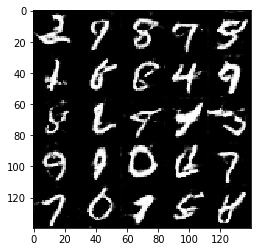

Epoch 3/25| Step 2050| Discriminator Loss:0.55386| Generator Loss:1.59470| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2100| Discriminator Loss:0.20705| Generator Loss:2.01187| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2150| Discriminator Loss:0.68743| Generator Loss:0.88460| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2200| Discriminator Loss:0.75678| Generator Loss:0.93948| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2250| Discriminator Loss:2.01370| Generator Loss:0.18652| Discriminator Loss>Generator Loss: True
Epoch 3/25| Step 2300| Discriminator Loss:0.37827| Generator Loss:1.48640| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2350| Discriminator Loss:0.55722| Generator Loss:1.02480| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2400| Discriminator Loss:0.26072| Generator Loss:2.88552| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2450| Discriminator Loss:0.21577| Generator Loss:1.83840

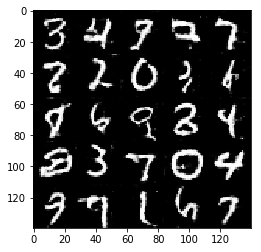

Epoch 3/25| Step 2550| Discriminator Loss:2.28330| Generator Loss:0.17538| Discriminator Loss>Generator Loss: True
Epoch 3/25| Step 2600| Discriminator Loss:0.30318| Generator Loss:1.68569| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2650| Discriminator Loss:0.17326| Generator Loss:2.39253| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2700| Discriminator Loss:0.18839| Generator Loss:2.04202| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2750| Discriminator Loss:0.73359| Generator Loss:2.30456| Discriminator Loss>Generator Loss: False
Epoch 3/25| Step 2800| Discriminator Loss:1.12909| Generator Loss:2.95274| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 2850| Discriminator Loss:1.32483| Generator Loss:0.55016| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 2900| Discriminator Loss:0.80569| Generator Loss:0.68432| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 2950| Discriminator Loss:0.99864| Generator Loss:0.54982| 

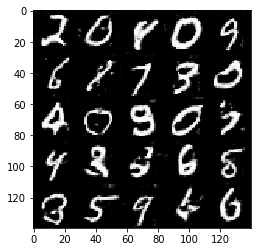

Epoch 4/25| Step 3050| Discriminator Loss:0.39715| Generator Loss:1.69062| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 3100| Discriminator Loss:1.04902| Generator Loss:0.56096| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 3150| Discriminator Loss:0.78689| Generator Loss:0.71950| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 3200| Discriminator Loss:0.04266| Generator Loss:4.79964| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 3250| Discriminator Loss:0.22052| Generator Loss:1.84896| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 3300| Discriminator Loss:0.03343| Generator Loss:5.06976| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 3350| Discriminator Loss:0.25308| Generator Loss:1.68598| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 3400| Discriminator Loss:1.09584| Generator Loss:0.52111| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 3450| Discriminator Loss:0.29510| Generator Loss:3.02369| 

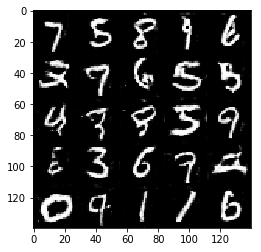

Epoch 4/25| Step 3550| Discriminator Loss:0.67711| Generator Loss:1.52611| Discriminator Loss>Generator Loss: False
Epoch 4/25| Step 3600| Discriminator Loss:1.39026| Generator Loss:0.32697| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 3650| Discriminator Loss:0.85043| Generator Loss:0.75415| Discriminator Loss>Generator Loss: True
Epoch 4/25| Step 3700| Discriminator Loss:0.62851| Generator Loss:1.09307| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 3750| Discriminator Loss:1.00714| Generator Loss:0.51711| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 3800| Discriminator Loss:1.68398| Generator Loss:0.23640| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 3850| Discriminator Loss:1.03515| Generator Loss:0.50760| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 3900| Discriminator Loss:0.47940| Generator Loss:3.42309| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 3950| Discriminator Loss:0.64534| Generator Loss:0.85154| Di

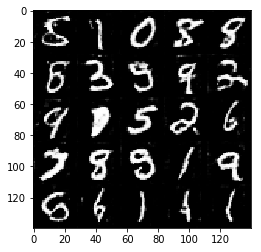

Epoch 5/25| Step 4050| Discriminator Loss:0.60727| Generator Loss:0.87043| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 4100| Discriminator Loss:1.04487| Generator Loss:4.24823| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 4150| Discriminator Loss:0.56285| Generator Loss:1.76855| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 4200| Discriminator Loss:1.98052| Generator Loss:0.18687| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 4250| Discriminator Loss:1.46654| Generator Loss:0.31033| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 4300| Discriminator Loss:1.49380| Generator Loss:0.32083| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 4350| Discriminator Loss:0.93331| Generator Loss:4.68337| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 4400| Discriminator Loss:1.44076| Generator Loss:0.31469| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 4450| Discriminator Loss:1.27441| Generator Loss:0.38838| D

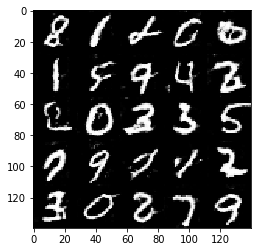

Epoch 5/25| Step 4550| Discriminator Loss:0.53373| Generator Loss:0.98596| Discriminator Loss>Generator Loss: False
Epoch 5/25| Step 4600| Discriminator Loss:0.97883| Generator Loss:0.57891| Discriminator Loss>Generator Loss: True
Epoch 5/25| Step 4650| Discriminator Loss:0.32669| Generator Loss:1.74925| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 4700| Discriminator Loss:2.12074| Generator Loss:0.17004| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 4750| Discriminator Loss:2.62060| Generator Loss:0.31437| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 4800| Discriminator Loss:1.95394| Generator Loss:0.35288| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 4850| Discriminator Loss:0.12177| Generator Loss:2.42359| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 4900| Discriminator Loss:1.41569| Generator Loss:0.32735| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 4950| Discriminator Loss:1.51534| Generator Loss:0.30685| Di

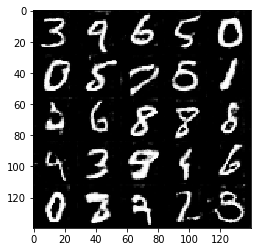

Epoch 6/25| Step 5050| Discriminator Loss:0.32254| Generator Loss:1.51854| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 5100| Discriminator Loss:1.04024| Generator Loss:0.49091| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 5150| Discriminator Loss:0.36062| Generator Loss:1.38558| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 5200| Discriminator Loss:2.27955| Generator Loss:0.12163| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 5250| Discriminator Loss:0.36237| Generator Loss:1.33219| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 5300| Discriminator Loss:0.81769| Generator Loss:0.72716| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 5350| Discriminator Loss:3.27427| Generator Loss:0.07830| Discriminator Loss>Generator Loss: True
Epoch 6/25| Step 5400| Discriminator Loss:0.84179| Generator Loss:4.08724| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 5450| Discriminator Loss:2.21079| Generator Loss:0.13493| D

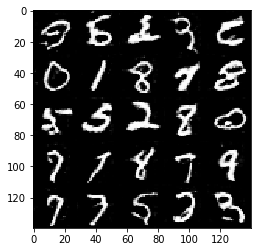

Epoch 6/25| Step 5550| Discriminator Loss:0.54473| Generator Loss:1.18029| Discriminator Loss>Generator Loss: False
Epoch 6/25| Step 5600| Discriminator Loss:2.61173| Generator Loss:0.09643| Discriminator Loss>Generator Loss: True
Epoch 7/25| Step 5650| Discriminator Loss:1.23413| Generator Loss:0.45925| Discriminator Loss>Generator Loss: True
Epoch 7/25| Step 5700| Discriminator Loss:0.09618| Generator Loss:2.71062| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 5750| Discriminator Loss:0.10953| Generator Loss:2.45441| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 5800| Discriminator Loss:0.41951| Generator Loss:1.22072| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 5850| Discriminator Loss:0.08692| Generator Loss:2.69416| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 5900| Discriminator Loss:0.94235| Generator Loss:0.56568| Discriminator Loss>Generator Loss: True
Epoch 7/25| Step 5950| Discriminator Loss:0.59405| Generator Loss:0.87336| 

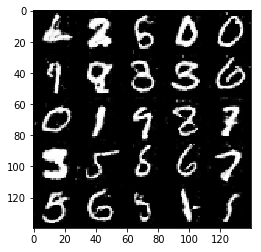

Epoch 7/25| Step 6050| Discriminator Loss:1.23809| Generator Loss:0.37856| Discriminator Loss>Generator Loss: True
Epoch 7/25| Step 6100| Discriminator Loss:0.45844| Generator Loss:1.13463| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 6150| Discriminator Loss:0.49218| Generator Loss:3.23873| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 6200| Discriminator Loss:0.39356| Generator Loss:3.66926| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 6250| Discriminator Loss:2.23248| Generator Loss:0.15316| Discriminator Loss>Generator Loss: True
Epoch 7/25| Step 6300| Discriminator Loss:0.25796| Generator Loss:1.93694| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 6350| Discriminator Loss:1.29081| Generator Loss:5.57541| Discriminator Loss>Generator Loss: False
Epoch 7/25| Step 6400| Discriminator Loss:1.08164| Generator Loss:0.60713| Discriminator Loss>Generator Loss: True
Epoch 7/25| Step 6450| Discriminator Loss:1.40549| Generator Loss:0.34124| 

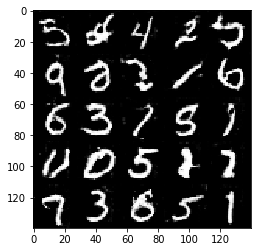

Epoch 7/25| Step 6550| Discriminator Loss:1.54806| Generator Loss:0.27830| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6600| Discriminator Loss:1.05932| Generator Loss:0.49414| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6650| Discriminator Loss:0.89071| Generator Loss:0.61348| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6700| Discriminator Loss:2.08853| Generator Loss:0.15086| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6750| Discriminator Loss:1.21757| Generator Loss:0.52480| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6800| Discriminator Loss:0.85184| Generator Loss:0.69487| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6850| Discriminator Loss:1.32386| Generator Loss:0.57111| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6900| Discriminator Loss:1.08186| Generator Loss:0.71457| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 6950| Discriminator Loss:1.31635| Generator Loss:0.41399| Discr

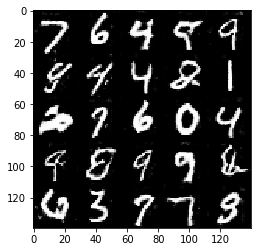

Epoch 8/25| Step 7050| Discriminator Loss:1.21655| Generator Loss:0.41267| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 7100| Discriminator Loss:0.34852| Generator Loss:1.41717| Discriminator Loss>Generator Loss: False
Epoch 8/25| Step 7150| Discriminator Loss:0.62087| Generator Loss:0.82442| Discriminator Loss>Generator Loss: False
Epoch 8/25| Step 7200| Discriminator Loss:2.24019| Generator Loss:0.13176| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 7250| Discriminator Loss:1.42969| Generator Loss:0.31675| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 7300| Discriminator Loss:2.79518| Generator Loss:0.07428| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 7350| Discriminator Loss:1.39279| Generator Loss:0.32550| Discriminator Loss>Generator Loss: True
Epoch 8/25| Step 7400| Discriminator Loss:0.41090| Generator Loss:1.33835| Discriminator Loss>Generator Loss: False
Epoch 8/25| Step 7450| Discriminator Loss:0.87292| Generator Loss:0.65480| Di

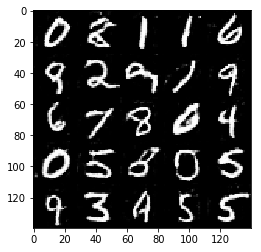

Epoch 9/25| Step 7550| Discriminator Loss:0.40765| Generator Loss:2.25561| Discriminator Loss>Generator Loss: False
Epoch 9/25| Step 7600| Discriminator Loss:0.63356| Generator Loss:1.00439| Discriminator Loss>Generator Loss: False
Epoch 9/25| Step 7650| Discriminator Loss:1.35960| Generator Loss:0.38588| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 7700| Discriminator Loss:1.46414| Generator Loss:0.30899| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 7750| Discriminator Loss:0.60902| Generator Loss:0.99378| Discriminator Loss>Generator Loss: False
Epoch 9/25| Step 7800| Discriminator Loss:1.60019| Generator Loss:0.26735| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 7850| Discriminator Loss:0.57825| Generator Loss:0.91644| Discriminator Loss>Generator Loss: False
Epoch 9/25| Step 7900| Discriminator Loss:1.34065| Generator Loss:0.34309| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 7950| Discriminator Loss:0.20691| Generator Loss:2.28257| D

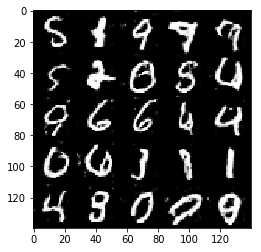

Epoch 9/25| Step 8050| Discriminator Loss:1.95684| Generator Loss:0.88439| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 8100| Discriminator Loss:1.32929| Generator Loss:0.49762| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 8150| Discriminator Loss:0.88647| Generator Loss:0.63361| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 8200| Discriminator Loss:1.11856| Generator Loss:0.57333| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 8250| Discriminator Loss:1.54045| Generator Loss:0.27379| Discriminator Loss>Generator Loss: True
Epoch 9/25| Step 8300| Discriminator Loss:1.07672| Generator Loss:4.64392| Discriminator Loss>Generator Loss: False
Epoch 9/25| Step 8350| Discriminator Loss:0.17388| Generator Loss:2.58082| Discriminator Loss>Generator Loss: False
Epoch 9/25| Step 8400| Discriminator Loss:2.77391| Generator Loss:0.07771| Discriminator Loss>Generator Loss: True
Epoch 10/25| Step 8450| Discriminator Loss:1.37830| Generator Loss:0.33912| Di

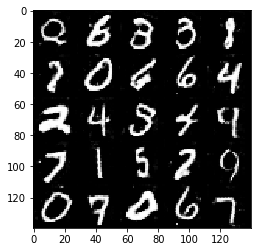

Epoch 10/25| Step 8550| Discriminator Loss:0.26963| Generator Loss:1.71149| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 8600| Discriminator Loss:0.79559| Generator Loss:0.73458| Discriminator Loss>Generator Loss: True
Epoch 10/25| Step 8650| Discriminator Loss:0.22814| Generator Loss:1.73235| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 8700| Discriminator Loss:1.88390| Generator Loss:0.19519| Discriminator Loss>Generator Loss: True
Epoch 10/25| Step 8750| Discriminator Loss:0.22668| Generator Loss:1.89097| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 8800| Discriminator Loss:0.15117| Generator Loss:2.18305| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 8850| Discriminator Loss:2.03086| Generator Loss:0.17707| Discriminator Loss>Generator Loss: True
Epoch 10/25| Step 8900| Discriminator Loss:0.07742| Generator Loss:2.83424| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 8950| Discriminator Loss:0.68271| Generator Loss:

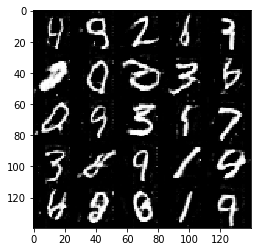

Epoch 10/25| Step 9050| Discriminator Loss:2.07984| Generator Loss:0.26542| Discriminator Loss>Generator Loss: True
Epoch 10/25| Step 9100| Discriminator Loss:1.92859| Generator Loss:0.36402| Discriminator Loss>Generator Loss: True
Epoch 10/25| Step 9150| Discriminator Loss:1.37597| Generator Loss:4.47362| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 9200| Discriminator Loss:0.31299| Generator Loss:1.64465| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 9250| Discriminator Loss:0.35652| Generator Loss:1.81434| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 9300| Discriminator Loss:0.75973| Generator Loss:0.84972| Discriminator Loss>Generator Loss: False
Epoch 10/25| Step 9350| Discriminator Loss:0.40890| Generator Loss:1.75670| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 9400| Discriminator Loss:1.34315| Generator Loss:0.35315| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 9450| Discriminator Loss:1.82463| Generator Loss:

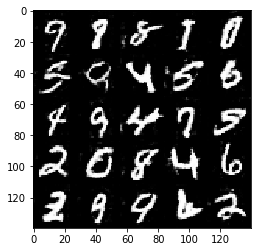

Epoch 11/25| Step 9550| Discriminator Loss:1.58421| Generator Loss:0.25789| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 9600| Discriminator Loss:3.23629| Generator Loss:0.06955| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 9650| Discriminator Loss:0.67948| Generator Loss:0.80054| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 9700| Discriminator Loss:1.89439| Generator Loss:0.24866| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 9750| Discriminator Loss:1.20334| Generator Loss:0.43896| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 9800| Discriminator Loss:0.70271| Generator Loss:0.94341| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 9850| Discriminator Loss:0.34164| Generator Loss:1.38571| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 9900| Discriminator Loss:0.58269| Generator Loss:0.98932| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 9950| Discriminator Loss:1.50386| Generator Loss:0

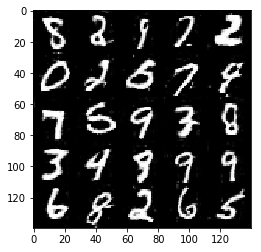

Epoch 11/25| Step 10050| Discriminator Loss:1.69530| Generator Loss:0.24254| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 10100| Discriminator Loss:0.43359| Generator Loss:1.16404| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 10150| Discriminator Loss:0.38137| Generator Loss:1.24376| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 10200| Discriminator Loss:1.41162| Generator Loss:0.32021| Discriminator Loss>Generator Loss: True
Epoch 11/25| Step 10250| Discriminator Loss:0.33527| Generator Loss:4.00248| Discriminator Loss>Generator Loss: False
Epoch 11/25| Step 10300| Discriminator Loss:0.38125| Generator Loss:4.34383| Discriminator Loss>Generator Loss: False
Epoch 12/25| Step 10350| Discriminator Loss:0.80828| Generator Loss:0.80741| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10400| Discriminator Loss:0.82128| Generator Loss:0.79510| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10450| Discriminator Loss:0.58005| Generat

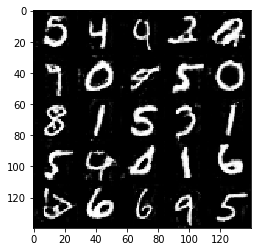

Epoch 12/25| Step 10550| Discriminator Loss:0.83968| Generator Loss:0.79924| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10600| Discriminator Loss:0.13618| Generator Loss:2.76616| Discriminator Loss>Generator Loss: False
Epoch 12/25| Step 10650| Discriminator Loss:1.76425| Generator Loss:0.23489| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10700| Discriminator Loss:0.71549| Generator Loss:2.47217| Discriminator Loss>Generator Loss: False
Epoch 12/25| Step 10750| Discriminator Loss:0.99491| Generator Loss:0.58669| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10800| Discriminator Loss:1.73051| Generator Loss:0.25456| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10850| Discriminator Loss:2.63085| Generator Loss:0.12498| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10900| Discriminator Loss:0.80477| Generator Loss:0.71916| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 10950| Discriminator Loss:2.65753| Generator

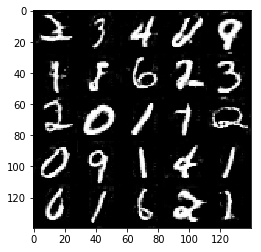

Epoch 12/25| Step 11050| Discriminator Loss:0.30712| Generator Loss:1.49303| Discriminator Loss>Generator Loss: False
Epoch 12/25| Step 11100| Discriminator Loss:1.07923| Generator Loss:0.47015| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 11150| Discriminator Loss:1.74681| Generator Loss:0.23920| Discriminator Loss>Generator Loss: True
Epoch 12/25| Step 11200| Discriminator Loss:0.72520| Generator Loss:0.75231| Discriminator Loss>Generator Loss: False
Epoch 13/25| Step 11250| Discriminator Loss:0.21540| Generator Loss:1.76430| Discriminator Loss>Generator Loss: False
Epoch 13/25| Step 11300| Discriminator Loss:2.74811| Generator Loss:0.07712| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11350| Discriminator Loss:0.50243| Generator Loss:1.04264| Discriminator Loss>Generator Loss: False
Epoch 13/25| Step 11400| Discriminator Loss:0.96840| Generator Loss:0.55594| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11450| Discriminator Loss:1.26942| Generat

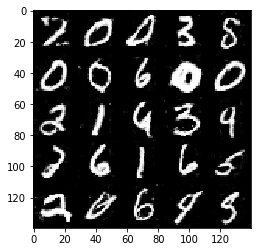

Epoch 13/25| Step 11550| Discriminator Loss:0.73207| Generator Loss:0.72846| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11600| Discriminator Loss:2.32463| Generator Loss:0.11790| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11650| Discriminator Loss:0.04968| Generator Loss:3.29535| Discriminator Loss>Generator Loss: False
Epoch 13/25| Step 11700| Discriminator Loss:3.65396| Generator Loss:0.04226| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11750| Discriminator Loss:0.30688| Generator Loss:1.45406| Discriminator Loss>Generator Loss: False
Epoch 13/25| Step 11800| Discriminator Loss:0.79269| Generator Loss:0.66551| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11850| Discriminator Loss:1.54635| Generator Loss:0.28030| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11900| Discriminator Loss:1.14253| Generator Loss:0.54889| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 11950| Discriminator Loss:2.13465| Generator

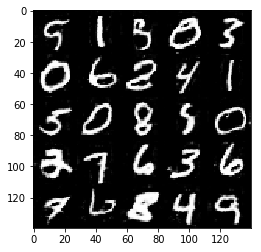

Epoch 13/25| Step 12050| Discriminator Loss:0.17940| Generator Loss:2.41806| Discriminator Loss>Generator Loss: False
Epoch 13/25| Step 12100| Discriminator Loss:0.99793| Generator Loss:0.99605| Discriminator Loss>Generator Loss: True
Epoch 13/25| Step 12150| Discriminator Loss:2.93691| Generator Loss:0.17245| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12200| Discriminator Loss:2.44887| Generator Loss:0.18797| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12250| Discriminator Loss:1.30176| Generator Loss:0.52360| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12300| Discriminator Loss:0.40469| Generator Loss:1.72655| Discriminator Loss>Generator Loss: False
Epoch 14/25| Step 12350| Discriminator Loss:1.14279| Generator Loss:0.47555| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12400| Discriminator Loss:1.20864| Generator Loss:0.49586| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12450| Discriminator Loss:2.39793| Generator

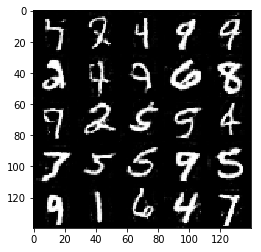

Epoch 14/25| Step 12550| Discriminator Loss:1.20515| Generator Loss:0.41737| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12600| Discriminator Loss:0.58959| Generator Loss:0.91311| Discriminator Loss>Generator Loss: False
Epoch 14/25| Step 12650| Discriminator Loss:2.90923| Generator Loss:0.07559| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12700| Discriminator Loss:4.04689| Generator Loss:0.03070| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12750| Discriminator Loss:1.54850| Generator Loss:0.39739| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12800| Discriminator Loss:0.79125| Generator Loss:0.81183| Discriminator Loss>Generator Loss: False
Epoch 14/25| Step 12850| Discriminator Loss:0.66908| Generator Loss:1.07100| Discriminator Loss>Generator Loss: False
Epoch 14/25| Step 12900| Discriminator Loss:1.72118| Generator Loss:0.24485| Discriminator Loss>Generator Loss: True
Epoch 14/25| Step 12950| Discriminator Loss:0.61541| Generato

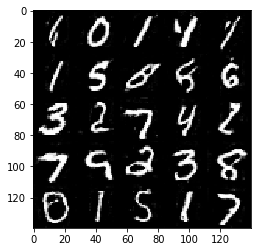

Epoch 14/25| Step 13050| Discriminator Loss:0.06843| Generator Loss:4.11598| Discriminator Loss>Generator Loss: False
Epoch 14/25| Step 13100| Discriminator Loss:1.96292| Generator Loss:0.20744| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13150| Discriminator Loss:1.62819| Generator Loss:0.25782| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13200| Discriminator Loss:0.94435| Generator Loss:0.58430| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13250| Discriminator Loss:1.82500| Generator Loss:0.21314| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13300| Discriminator Loss:1.37139| Generator Loss:0.33762| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13350| Discriminator Loss:0.68493| Generator Loss:1.01074| Discriminator Loss>Generator Loss: False
Epoch 15/25| Step 13400| Discriminator Loss:0.60967| Generator Loss:6.26285| Discriminator Loss>Generator Loss: False
Epoch 15/25| Step 13450| Discriminator Loss:0.84761| Generato

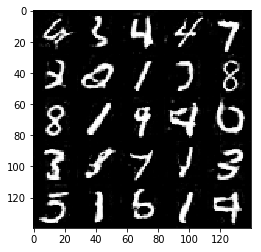

Epoch 15/25| Step 13550| Discriminator Loss:0.30878| Generator Loss:1.56437| Discriminator Loss>Generator Loss: False
Epoch 15/25| Step 13600| Discriminator Loss:1.54061| Generator Loss:0.28554| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13650| Discriminator Loss:1.26290| Generator Loss:0.54274| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13700| Discriminator Loss:1.90884| Generator Loss:0.21447| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13750| Discriminator Loss:2.45340| Generator Loss:0.10473| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13800| Discriminator Loss:1.18023| Generator Loss:0.44804| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13850| Discriminator Loss:3.13689| Generator Loss:0.05216| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13900| Discriminator Loss:1.70665| Generator Loss:0.22908| Discriminator Loss>Generator Loss: True
Epoch 15/25| Step 13950| Discriminator Loss:1.25752| Generator 

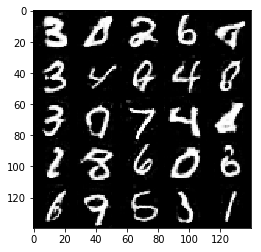

Epoch 15/25| Step 14050| Discriminator Loss:1.60432| Generator Loss:0.25700| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14100| Discriminator Loss:0.40922| Generator Loss:1.21455| Discriminator Loss>Generator Loss: False
Epoch 16/25| Step 14150| Discriminator Loss:0.40710| Generator Loss:1.19817| Discriminator Loss>Generator Loss: False
Epoch 16/25| Step 14200| Discriminator Loss:1.33132| Generator Loss:0.34099| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14250| Discriminator Loss:2.52376| Generator Loss:0.09773| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14300| Discriminator Loss:0.18480| Generator Loss:3.12230| Discriminator Loss>Generator Loss: False
Epoch 16/25| Step 14350| Discriminator Loss:1.11649| Generator Loss:0.58843| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14400| Discriminator Loss:0.17632| Generator Loss:2.18280| Discriminator Loss>Generator Loss: False
Epoch 16/25| Step 14450| Discriminator Loss:0.64104| Generat

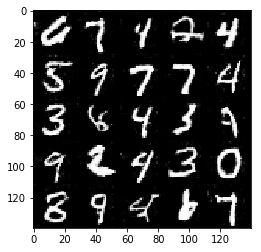

Epoch 16/25| Step 14550| Discriminator Loss:1.91174| Generator Loss:0.19060| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14600| Discriminator Loss:1.53599| Generator Loss:0.29794| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14650| Discriminator Loss:4.13756| Generator Loss:0.02235| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14700| Discriminator Loss:0.87304| Generator Loss:0.63186| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14750| Discriminator Loss:2.59255| Generator Loss:0.09717| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14800| Discriminator Loss:0.16765| Generator Loss:5.03898| Discriminator Loss>Generator Loss: False
Epoch 16/25| Step 14850| Discriminator Loss:1.96874| Generator Loss:0.32935| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14900| Discriminator Loss:1.23416| Generator Loss:0.54137| Discriminator Loss>Generator Loss: True
Epoch 16/25| Step 14950| Discriminator Loss:2.17210| Generator 

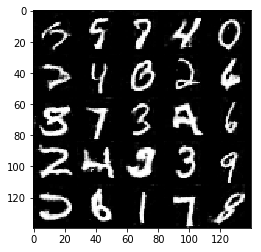

Epoch 17/25| Step 15050| Discriminator Loss:1.98887| Generator Loss:0.18393| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15100| Discriminator Loss:0.59519| Generator Loss:1.18330| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15150| Discriminator Loss:2.57711| Generator Loss:0.09746| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15200| Discriminator Loss:0.29047| Generator Loss:1.61939| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15250| Discriminator Loss:2.62095| Generator Loss:0.09751| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15300| Discriminator Loss:0.23345| Generator Loss:1.76589| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15350| Discriminator Loss:0.56931| Generator Loss:0.96794| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15400| Discriminator Loss:0.96654| Generator Loss:0.57678| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15450| Discriminator Loss:0.00485| Generat

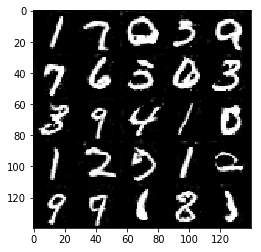

Epoch 17/25| Step 15550| Discriminator Loss:2.71613| Generator Loss:0.08270| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15600| Discriminator Loss:0.07441| Generator Loss:2.99312| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15650| Discriminator Loss:0.29366| Generator Loss:1.50774| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15700| Discriminator Loss:4.72521| Generator Loss:0.03682| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15750| Discriminator Loss:0.45710| Generator Loss:1.51617| Discriminator Loss>Generator Loss: False
Epoch 17/25| Step 15800| Discriminator Loss:1.13449| Generator Loss:0.70216| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15850| Discriminator Loss:1.30107| Generator Loss:0.47847| Discriminator Loss>Generator Loss: True
Epoch 17/25| Step 15900| Discriminator Loss:0.19630| Generator Loss:6.13813| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 15950| Discriminator Loss:2.95603| Generat

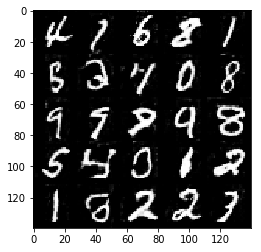

Epoch 18/25| Step 16050| Discriminator Loss:2.18329| Generator Loss:0.17421| Discriminator Loss>Generator Loss: True
Epoch 18/25| Step 16100| Discriminator Loss:3.34009| Generator Loss:0.08251| Discriminator Loss>Generator Loss: True
Epoch 18/25| Step 16150| Discriminator Loss:0.54042| Generator Loss:1.01138| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16200| Discriminator Loss:0.59034| Generator Loss:0.96699| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16250| Discriminator Loss:0.52260| Generator Loss:1.00526| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16300| Discriminator Loss:0.28089| Generator Loss:1.56901| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16350| Discriminator Loss:0.62071| Generator Loss:0.92163| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16400| Discriminator Loss:2.43531| Generator Loss:0.11437| Discriminator Loss>Generator Loss: True
Epoch 18/25| Step 16450| Discriminator Loss:2.21535| Genera

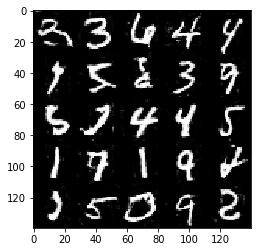

Epoch 18/25| Step 16550| Discriminator Loss:1.79404| Generator Loss:0.20856| Discriminator Loss>Generator Loss: True
Epoch 18/25| Step 16600| Discriminator Loss:0.34896| Generator Loss:1.36330| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16650| Discriminator Loss:1.14605| Generator Loss:0.44736| Discriminator Loss>Generator Loss: True
Epoch 18/25| Step 16700| Discriminator Loss:0.02180| Generator Loss:4.41450| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16750| Discriminator Loss:1.42424| Generator Loss:0.31062| Discriminator Loss>Generator Loss: True
Epoch 18/25| Step 16800| Discriminator Loss:0.08808| Generator Loss:2.62349| Discriminator Loss>Generator Loss: False
Epoch 18/25| Step 16850| Discriminator Loss:0.68203| Generator Loss:0.83623| Discriminator Loss>Generator Loss: False
Epoch 19/25| Step 16900| Discriminator Loss:0.33047| Generator Loss:1.37183| Discriminator Loss>Generator Loss: False
Epoch 19/25| Step 16950| Discriminator Loss:0.43958| Genera

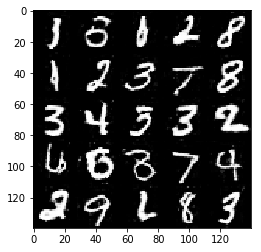

Epoch 19/25| Step 17050| Discriminator Loss:3.17335| Generator Loss:0.05084| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17100| Discriminator Loss:0.49730| Generator Loss:1.78086| Discriminator Loss>Generator Loss: False
Epoch 19/25| Step 17150| Discriminator Loss:0.21835| Generator Loss:1.91789| Discriminator Loss>Generator Loss: False
Epoch 19/25| Step 17200| Discriminator Loss:2.69585| Generator Loss:0.08383| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17250| Discriminator Loss:2.00829| Generator Loss:0.17027| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17300| Discriminator Loss:1.46578| Generator Loss:0.53748| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17350| Discriminator Loss:0.49539| Generator Loss:1.44272| Discriminator Loss>Generator Loss: False
Epoch 19/25| Step 17400| Discriminator Loss:0.71686| Generator Loss:0.86347| Discriminator Loss>Generator Loss: False
Epoch 19/25| Step 17450| Discriminator Loss:0.24521| Generat

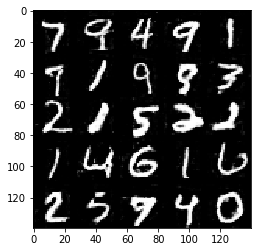

Epoch 19/25| Step 17550| Discriminator Loss:1.51390| Generator Loss:0.35884| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17600| Discriminator Loss:1.24721| Generator Loss:0.48451| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17650| Discriminator Loss:1.33916| Generator Loss:0.39957| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17700| Discriminator Loss:1.91832| Generator Loss:0.20241| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17750| Discriminator Loss:2.17902| Generator Loss:0.29149| Discriminator Loss>Generator Loss: True
Epoch 19/25| Step 17800| Discriminator Loss:0.13067| Generator Loss:2.40810| Discriminator Loss>Generator Loss: False
Epoch 20/25| Step 17850| Discriminator Loss:0.11226| Generator Loss:2.49856| Discriminator Loss>Generator Loss: False
Epoch 20/25| Step 17900| Discriminator Loss:1.07399| Generator Loss:0.50160| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 17950| Discriminator Loss:0.25627| Generator

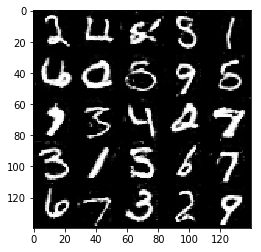

Epoch 20/25| Step 18050| Discriminator Loss:0.89814| Generator Loss:0.65457| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18100| Discriminator Loss:1.13824| Generator Loss:0.56850| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18150| Discriminator Loss:1.48464| Generator Loss:0.32448| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18200| Discriminator Loss:2.10752| Generator Loss:0.22286| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18250| Discriminator Loss:2.68176| Generator Loss:0.09331| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18300| Discriminator Loss:0.58197| Generator Loss:1.12553| Discriminator Loss>Generator Loss: False
Epoch 20/25| Step 18350| Discriminator Loss:2.47205| Generator Loss:0.12315| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18400| Discriminator Loss:0.27257| Generator Loss:2.15730| Discriminator Loss>Generator Loss: False
Epoch 20/25| Step 18450| Discriminator Loss:2.45001| Generator

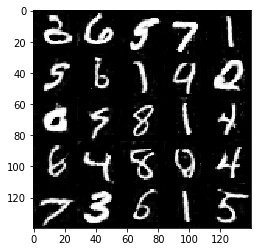

Epoch 20/25| Step 18550| Discriminator Loss:1.67805| Generator Loss:0.28536| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18600| Discriminator Loss:0.14683| Generator Loss:2.16228| Discriminator Loss>Generator Loss: False
Epoch 20/25| Step 18650| Discriminator Loss:1.19972| Generator Loss:0.42696| Discriminator Loss>Generator Loss: True
Epoch 20/25| Step 18700| Discriminator Loss:3.40133| Generator Loss:0.04345| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 18750| Discriminator Loss:0.06647| Generator Loss:3.10597| Discriminator Loss>Generator Loss: False
Epoch 21/25| Step 18800| Discriminator Loss:1.83084| Generator Loss:0.53872| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 18850| Discriminator Loss:2.36403| Generator Loss:0.12181| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 18900| Discriminator Loss:1.58253| Generator Loss:0.27476| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 18950| Discriminator Loss:1.13582| Generator

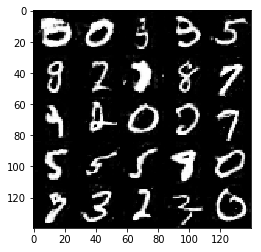

Epoch 21/25| Step 19050| Discriminator Loss:0.64513| Generator Loss:0.81796| Discriminator Loss>Generator Loss: False
Epoch 21/25| Step 19100| Discriminator Loss:0.44120| Generator Loss:1.12524| Discriminator Loss>Generator Loss: False
Epoch 21/25| Step 19150| Discriminator Loss:1.16382| Generator Loss:0.43352| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19200| Discriminator Loss:1.64827| Generator Loss:0.24799| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19250| Discriminator Loss:1.19669| Generator Loss:0.42238| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19300| Discriminator Loss:1.34861| Generator Loss:0.34902| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19350| Discriminator Loss:1.50241| Generator Loss:0.31860| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19400| Discriminator Loss:0.75717| Generator Loss:0.71690| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19450| Discriminator Loss:1.27513| Generator

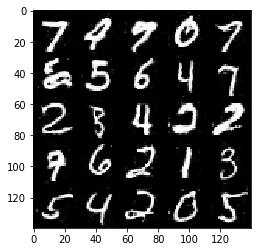

Epoch 21/25| Step 19550| Discriminator Loss:0.96913| Generator Loss:0.60361| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19600| Discriminator Loss:3.13110| Generator Loss:0.05417| Discriminator Loss>Generator Loss: True
Epoch 21/25| Step 19650| Discriminator Loss:0.18998| Generator Loss:1.88072| Discriminator Loss>Generator Loss: False
Epoch 22/25| Step 19700| Discriminator Loss:1.20741| Generator Loss:7.27016| Discriminator Loss>Generator Loss: False
Epoch 22/25| Step 19750| Discriminator Loss:0.14546| Generator Loss:4.58998| Discriminator Loss>Generator Loss: False
Epoch 22/25| Step 19800| Discriminator Loss:0.71314| Generator Loss:1.10511| Discriminator Loss>Generator Loss: False
Epoch 22/25| Step 19850| Discriminator Loss:0.61089| Generator Loss:1.03927| Discriminator Loss>Generator Loss: False
Epoch 22/25| Step 19900| Discriminator Loss:1.42372| Generator Loss:0.37367| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 19950| Discriminator Loss:0.07916| Genera

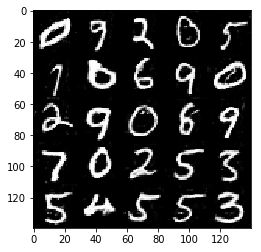

Epoch 22/25| Step 20050| Discriminator Loss:1.32675| Generator Loss:0.43351| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20100| Discriminator Loss:1.45590| Generator Loss:0.34889| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20150| Discriminator Loss:2.72048| Generator Loss:0.07830| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20200| Discriminator Loss:1.60150| Generator Loss:0.28722| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20250| Discriminator Loss:1.74144| Generator Loss:0.30060| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20300| Discriminator Loss:2.17438| Generator Loss:0.19268| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20350| Discriminator Loss:2.18677| Generator Loss:0.17718| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20400| Discriminator Loss:3.19924| Generator Loss:0.06489| Discriminator Loss>Generator Loss: True
Epoch 22/25| Step 20450| Discriminator Loss:0.23803| Generator L

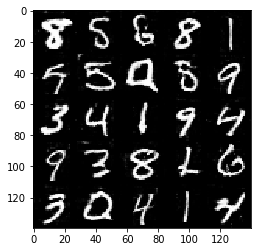

Epoch 22/25| Step 20550| Discriminator Loss:0.69981| Generator Loss:0.90775| Discriminator Loss>Generator Loss: False
Epoch 22/25| Step 20600| Discriminator Loss:0.77595| Generator Loss:0.76610| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 20650| Discriminator Loss:0.69281| Generator Loss:0.81161| Discriminator Loss>Generator Loss: False
Epoch 23/25| Step 20700| Discriminator Loss:1.29167| Generator Loss:0.38967| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 20750| Discriminator Loss:0.30411| Generator Loss:1.52798| Discriminator Loss>Generator Loss: False
Epoch 23/25| Step 20800| Discriminator Loss:3.06437| Generator Loss:0.06600| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 20850| Discriminator Loss:0.31544| Generator Loss:1.42911| Discriminator Loss>Generator Loss: False
Epoch 23/25| Step 20900| Discriminator Loss:0.85933| Generator Loss:0.63423| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 20950| Discriminator Loss:2.20894| Generat

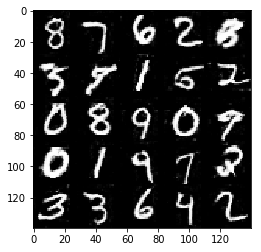

Epoch 23/25| Step 21050| Discriminator Loss:2.39892| Generator Loss:0.13243| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 21100| Discriminator Loss:2.38289| Generator Loss:0.12532| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 21150| Discriminator Loss:0.43400| Generator Loss:1.22488| Discriminator Loss>Generator Loss: False
Epoch 23/25| Step 21200| Discriminator Loss:0.72599| Generator Loss:0.75147| Discriminator Loss>Generator Loss: False
Epoch 23/25| Step 21250| Discriminator Loss:3.38184| Generator Loss:0.05853| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 21300| Discriminator Loss:1.25774| Generator Loss:0.74292| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 21350| Discriminator Loss:1.44708| Generator Loss:0.37034| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 21400| Discriminator Loss:0.91897| Generator Loss:0.82289| Discriminator Loss>Generator Loss: True
Epoch 23/25| Step 21450| Discriminator Loss:1.34476| Generator

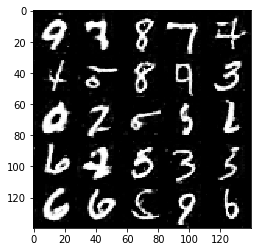

Epoch 23/25| Step 21550| Discriminator Loss:1.62327| Generator Loss:0.25699| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 21600| Discriminator Loss:1.71076| Generator Loss:0.23533| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 21650| Discriminator Loss:1.96516| Generator Loss:0.42208| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 21700| Discriminator Loss:0.66965| Generator Loss:0.91961| Discriminator Loss>Generator Loss: False
Epoch 24/25| Step 21750| Discriminator Loss:2.70383| Generator Loss:0.12088| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 21800| Discriminator Loss:1.70545| Generator Loss:0.23583| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 21850| Discriminator Loss:0.07783| Generator Loss:2.95395| Discriminator Loss>Generator Loss: False
Epoch 24/25| Step 21900| Discriminator Loss:3.93187| Generator Loss:0.04842| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 21950| Discriminator Loss:3.61740| Generator

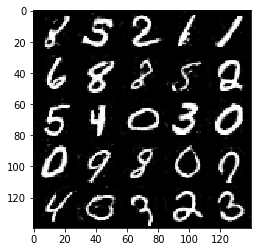

Epoch 24/25| Step 22050| Discriminator Loss:3.16847| Generator Loss:0.05303| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 22100| Discriminator Loss:1.88679| Generator Loss:0.20772| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 22150| Discriminator Loss:1.74152| Generator Loss:0.22789| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 22200| Discriminator Loss:0.06186| Generator Loss:7.59141| Discriminator Loss>Generator Loss: False
Epoch 24/25| Step 22250| Discriminator Loss:1.99864| Generator Loss:0.18386| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 22300| Discriminator Loss:1.91954| Generator Loss:0.22361| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 22350| Discriminator Loss:1.72040| Generator Loss:0.37317| Discriminator Loss>Generator Loss: True
Epoch 24/25| Step 22400| Discriminator Loss:0.71880| Generator Loss:0.78498| Discriminator Loss>Generator Loss: False
Epoch 24/25| Step 22450| Discriminator Loss:1.76867| Generator

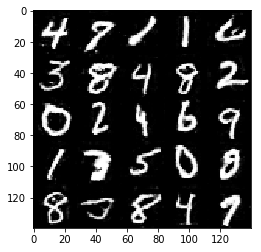

Epoch 25/25| Step 22550| Discriminator Loss:0.39516| Generator Loss:1.56362| Discriminator Loss>Generator Loss: False
Epoch 25/25| Step 22600| Discriminator Loss:1.16340| Generator Loss:0.47122| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 22650| Discriminator Loss:2.03689| Generator Loss:0.16962| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 22700| Discriminator Loss:0.66836| Generator Loss:0.83364| Discriminator Loss>Generator Loss: False
Epoch 25/25| Step 22750| Discriminator Loss:1.85164| Generator Loss:0.19988| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 22800| Discriminator Loss:0.03254| Generator Loss:3.66191| Discriminator Loss>Generator Loss: False
Epoch 25/25| Step 22850| Discriminator Loss:0.90663| Generator Loss:0.61323| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 22900| Discriminator Loss:0.12542| Generator Loss:2.32470| Discriminator Loss>Generator Loss: False
Epoch 25/25| Step 22950| Discriminator Loss:0.01724| Generat

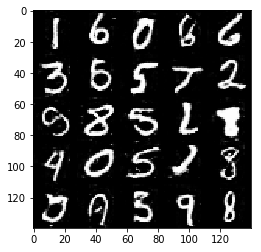

Epoch 25/25| Step 23050| Discriminator Loss:2.73523| Generator Loss:0.30497| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 23100| Discriminator Loss:1.26699| Generator Loss:0.63304| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 23150| Discriminator Loss:0.63811| Generator Loss:1.09990| Discriminator Loss>Generator Loss: False
Epoch 25/25| Step 23200| Discriminator Loss:2.05525| Generator Loss:0.49158| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 23250| Discriminator Loss:0.29737| Generator Loss:2.26042| Discriminator Loss>Generator Loss: False
Epoch 25/25| Step 23300| Discriminator Loss:1.08911| Generator Loss:0.89905| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 23350| Discriminator Loss:1.50228| Generator Loss:0.32237| Discriminator Loss>Generator Loss: True
Epoch 25/25| Step 23400| Discriminator Loss:1.75917| Generator Loss:0.25953| Discriminator Loss>Generator Loss: True

DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 12

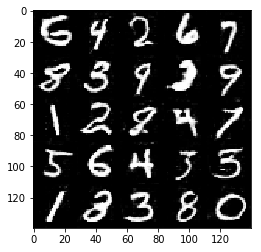

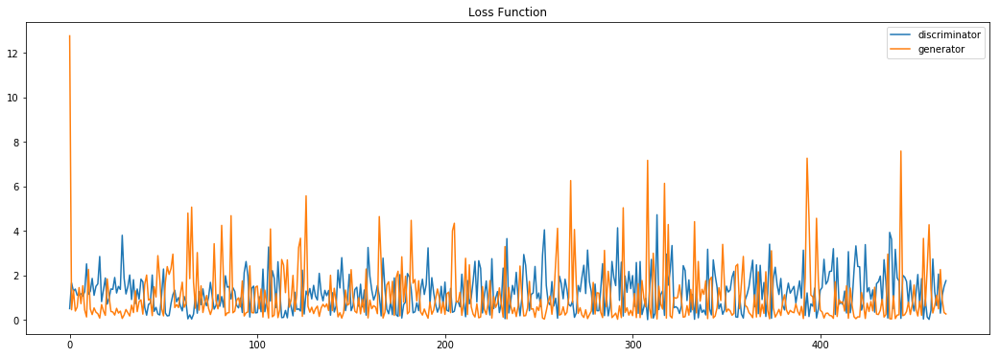

In [39]:
batch_size = 64
z_dim = 128
learning_rate = 0.001
beta1 = 0.2

epochs = 25
alpha = 0.2
beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""

mnist_dataset = Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))

with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode, alpha=alpha)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.


DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 128)
DL4: (?, 28, 28, 3)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
L1: (?, 14, 14, 64)
L2: (?, 7, 7, 128)
L3: (?, 4, 4, 256)
L4: (?, 2, 2, 512)
L5: (?, 1)
Epoch 1/10| Step 50| Discriminator Loss:1.76753| Generator Loss:0.28755| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 100| Discriminator Loss:1.49257| Generator Loss:0.70981| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 150| Discriminator Loss:1.55677| Generator Loss:0.71989| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 200| Discriminator Loss:1.16356| Generator Loss:0.69585| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 250| Discriminator Loss:1.25665| Generator Loss:0.55249| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 300| Discriminator Loss:1.07509| Generator Loss:0.79609| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 350| Discriminator Loss:1.45598| Genera

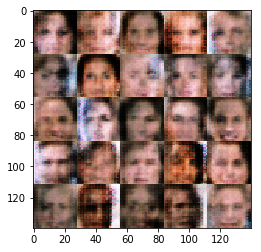

Epoch 1/10| Step 550| Discriminator Loss:1.50267| Generator Loss:0.71413| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 600| Discriminator Loss:1.29711| Generator Loss:0.66394| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 650| Discriminator Loss:1.51908| Generator Loss:0.37006| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 700| Discriminator Loss:1.62076| Generator Loss:0.71734| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 750| Discriminator Loss:1.41481| Generator Loss:0.64885| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 800| Discriminator Loss:1.36750| Generator Loss:0.43582| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 850| Discriminator Loss:1.43225| Generator Loss:0.57197| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 900| Discriminator Loss:1.49728| Generator Loss:0.35571| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 950| Discriminator Loss:1.33606| Generator Loss:0.55546| Discriminator 

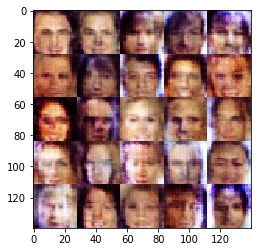

Epoch 1/10| Step 1050| Discriminator Loss:1.52906| Generator Loss:0.58759| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1100| Discriminator Loss:1.61901| Generator Loss:0.40588| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1150| Discriminator Loss:1.56540| Generator Loss:0.47838| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1200| Discriminator Loss:1.23435| Generator Loss:0.89122| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1250| Discriminator Loss:1.90110| Generator Loss:0.28677| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1300| Discriminator Loss:1.70489| Generator Loss:0.26111| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1350| Discriminator Loss:1.71491| Generator Loss:0.27530| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1400| Discriminator Loss:1.23647| Generator Loss:0.78907| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1450| Discriminator Loss:1.35922| Generator Loss:0.68524| Discr

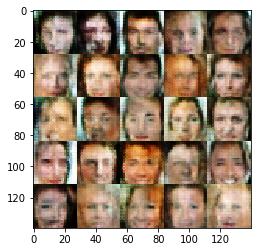

Epoch 1/10| Step 1550| Discriminator Loss:1.08635| Generator Loss:0.74175| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1600| Discriminator Loss:1.22084| Generator Loss:1.06009| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1650| Discriminator Loss:1.52106| Generator Loss:0.91748| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1700| Discriminator Loss:1.43053| Generator Loss:0.78879| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1750| Discriminator Loss:1.33662| Generator Loss:0.53638| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1800| Discriminator Loss:1.21779| Generator Loss:0.82690| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1850| Discriminator Loss:1.36004| Generator Loss:0.64008| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1900| Discriminator Loss:1.54630| Generator Loss:0.36063| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 1950| Discriminator Loss:1.45333| Generator Loss:0.54557| Discr

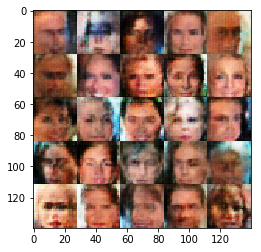

Epoch 1/10| Step 2050| Discriminator Loss:1.46918| Generator Loss:0.58253| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2100| Discriminator Loss:1.43152| Generator Loss:0.47063| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2150| Discriminator Loss:1.23902| Generator Loss:0.76048| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2200| Discriminator Loss:1.44924| Generator Loss:0.58685| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2250| Discriminator Loss:1.39095| Generator Loss:0.80492| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2300| Discriminator Loss:1.56059| Generator Loss:0.37487| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2350| Discriminator Loss:1.44417| Generator Loss:0.83608| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2400| Discriminator Loss:1.27422| Generator Loss:0.64521| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2500| Discriminator Loss:1.25718| Generator Loss:0.78816| Discr

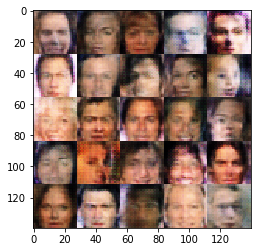

Epoch 1/10| Step 2550| Discriminator Loss:1.46173| Generator Loss:0.41982| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2600| Discriminator Loss:1.50879| Generator Loss:0.41334| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2650| Discriminator Loss:1.44821| Generator Loss:0.48716| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2700| Discriminator Loss:1.43289| Generator Loss:0.64960| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2750| Discriminator Loss:1.27570| Generator Loss:0.66322| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2800| Discriminator Loss:1.28847| Generator Loss:0.82363| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2850| Discriminator Loss:1.11807| Generator Loss:0.59540| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2900| Discriminator Loss:1.28025| Generator Loss:0.63520| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 2950| Discriminator Loss:1.26037| Generator Loss:1.01826| Discr

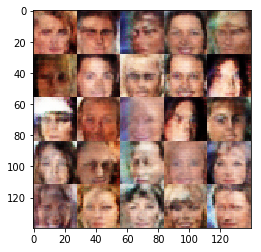

Epoch 1/10| Step 3050| Discriminator Loss:1.12551| Generator Loss:0.89297| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3100| Discriminator Loss:1.42001| Generator Loss:0.53623| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3150| Discriminator Loss:1.37367| Generator Loss:0.45331| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3200| Discriminator Loss:1.46071| Generator Loss:0.45307| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3250| Discriminator Loss:1.41632| Generator Loss:0.67120| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3300| Discriminator Loss:1.53075| Generator Loss:0.53914| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3350| Discriminator Loss:1.79845| Generator Loss:0.35804| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3400| Discriminator Loss:1.39618| Generator Loss:0.76675| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3450| Discriminator Loss:1.36434| Generator Loss:0.55684| Discr

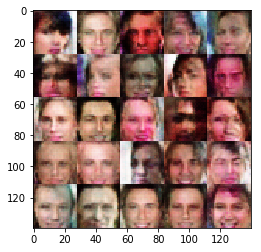

Epoch 1/10| Step 3550| Discriminator Loss:1.60715| Generator Loss:0.47844| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3600| Discriminator Loss:1.43207| Generator Loss:0.44508| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3650| Discriminator Loss:1.56375| Generator Loss:0.41313| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3700| Discriminator Loss:1.73472| Generator Loss:0.29409| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3750| Discriminator Loss:1.36233| Generator Loss:0.49399| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3800| Discriminator Loss:1.17965| Generator Loss:0.56694| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3850| Discriminator Loss:1.92100| Generator Loss:0.22856| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3900| Discriminator Loss:1.32419| Generator Loss:0.57897| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 3950| Discriminator Loss:1.45885| Generator Loss:0.37411| Discr

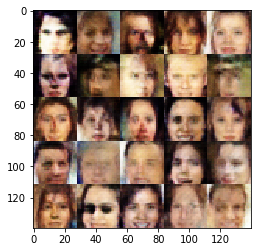

Epoch 1/10| Step 4050| Discriminator Loss:1.41156| Generator Loss:0.54442| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4100| Discriminator Loss:1.54380| Generator Loss:0.31541| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4150| Discriminator Loss:1.28051| Generator Loss:0.94073| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4200| Discriminator Loss:1.62090| Generator Loss:0.36271| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4250| Discriminator Loss:2.04202| Generator Loss:0.30523| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4300| Discriminator Loss:1.40950| Generator Loss:0.52632| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4350| Discriminator Loss:1.55132| Generator Loss:0.50121| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4400| Discriminator Loss:1.37769| Generator Loss:0.73543| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4450| Discriminator Loss:1.35276| Generator Loss:0.53020| Discr

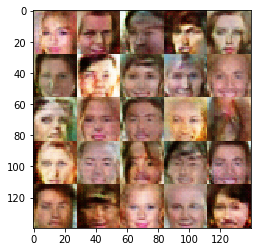

Epoch 1/10| Step 4550| Discriminator Loss:1.06482| Generator Loss:0.70562| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4600| Discriminator Loss:1.36620| Generator Loss:0.53831| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4650| Discriminator Loss:1.73314| Generator Loss:0.39186| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4700| Discriminator Loss:1.28498| Generator Loss:0.58260| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4750| Discriminator Loss:1.20204| Generator Loss:0.59858| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4800| Discriminator Loss:1.53662| Generator Loss:0.41319| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4850| Discriminator Loss:1.44556| Generator Loss:0.39048| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4900| Discriminator Loss:1.32866| Generator Loss:0.52132| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 4950| Discriminator Loss:1.30582| Generator Loss:0.50611| Discr

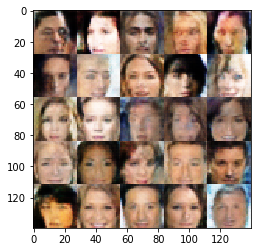

Epoch 1/10| Step 5050| Discriminator Loss:1.56250| Generator Loss:0.50669| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5100| Discriminator Loss:1.30998| Generator Loss:0.55604| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5150| Discriminator Loss:1.40473| Generator Loss:0.46476| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5200| Discriminator Loss:1.24894| Generator Loss:0.64469| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5250| Discriminator Loss:1.38505| Generator Loss:0.41166| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5300| Discriminator Loss:1.79889| Generator Loss:0.22944| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5350| Discriminator Loss:1.45132| Generator Loss:0.55302| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5400| Discriminator Loss:1.35502| Generator Loss:0.55420| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5450| Discriminator Loss:1.22640| Generator Loss:0.53790| Discr

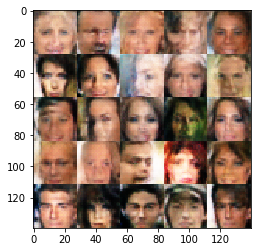

Epoch 1/10| Step 5550| Discriminator Loss:1.67287| Generator Loss:0.37639| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5600| Discriminator Loss:0.92446| Generator Loss:0.78933| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5650| Discriminator Loss:1.58868| Generator Loss:0.31352| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5700| Discriminator Loss:1.65343| Generator Loss:0.33292| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5750| Discriminator Loss:1.44086| Generator Loss:0.40283| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5800| Discriminator Loss:1.30465| Generator Loss:0.52648| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5850| Discriminator Loss:1.31580| Generator Loss:0.60716| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5900| Discriminator Loss:1.44249| Generator Loss:0.55222| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 5950| Discriminator Loss:1.22341| Generator Loss:0.57428| Discr

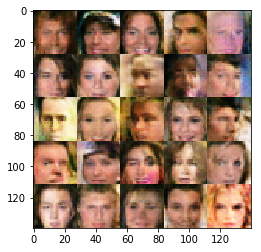

Epoch 1/10| Step 6050| Discriminator Loss:1.65657| Generator Loss:0.31798| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 6100| Discriminator Loss:1.46381| Generator Loss:0.37353| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 6150| Discriminator Loss:1.53368| Generator Loss:0.39515| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 6200| Discriminator Loss:1.22527| Generator Loss:0.63771| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 6250| Discriminator Loss:1.61916| Generator Loss:0.59087| Discriminator Loss>Generator Loss: True
Epoch 1/10| Step 6300| Discriminator Loss:1.44062| Generator Loss:0.58487| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6350| Discriminator Loss:1.19462| Generator Loss:0.67204| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6400| Discriminator Loss:0.90099| Generator Loss:0.79997| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6450| Discriminator Loss:1.67223| Generator Loss:0.29946| Discr

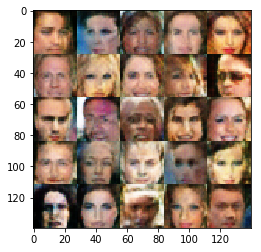

Epoch 2/10| Step 6550| Discriminator Loss:1.48665| Generator Loss:0.53745| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6600| Discriminator Loss:1.52926| Generator Loss:0.40270| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6650| Discriminator Loss:1.23931| Generator Loss:0.55260| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6700| Discriminator Loss:1.08014| Generator Loss:0.80425| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6750| Discriminator Loss:1.24163| Generator Loss:0.51957| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6800| Discriminator Loss:1.82672| Generator Loss:0.21598| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6850| Discriminator Loss:1.43146| Generator Loss:0.42139| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6900| Discriminator Loss:1.25932| Generator Loss:0.53278| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 6950| Discriminator Loss:1.36246| Generator Loss:0.56734| Discr

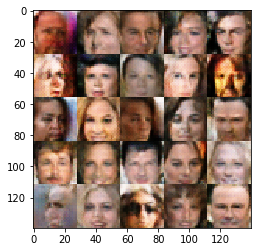

Epoch 2/10| Step 7050| Discriminator Loss:1.52105| Generator Loss:0.41411| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7100| Discriminator Loss:1.26082| Generator Loss:0.55720| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7150| Discriminator Loss:1.13589| Generator Loss:0.63701| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7200| Discriminator Loss:1.48612| Generator Loss:0.42424| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7250| Discriminator Loss:0.88758| Generator Loss:0.76225| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7300| Discriminator Loss:1.62550| Generator Loss:0.49231| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7350| Discriminator Loss:1.45885| Generator Loss:0.45761| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7400| Discriminator Loss:1.20452| Generator Loss:0.58471| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7450| Discriminator Loss:1.60976| Generator Loss:0.40412| Discr

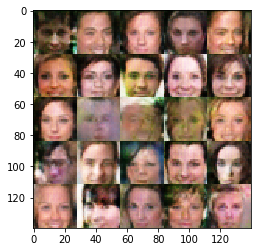

Epoch 2/10| Step 7550| Discriminator Loss:1.15232| Generator Loss:0.63152| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7600| Discriminator Loss:1.62535| Generator Loss:0.41651| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7650| Discriminator Loss:2.90454| Generator Loss:0.06343| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7700| Discriminator Loss:1.39105| Generator Loss:0.73318| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7750| Discriminator Loss:1.57577| Generator Loss:0.39064| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7800| Discriminator Loss:1.74179| Generator Loss:0.34988| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7850| Discriminator Loss:1.30522| Generator Loss:0.41052| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7900| Discriminator Loss:1.38023| Generator Loss:0.48339| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 7950| Discriminator Loss:1.38276| Generator Loss:0.55231| Discr

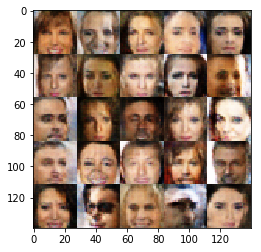

Epoch 2/10| Step 8050| Discriminator Loss:1.51150| Generator Loss:0.41104| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8100| Discriminator Loss:1.19605| Generator Loss:0.59654| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8150| Discriminator Loss:1.38008| Generator Loss:0.42160| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8200| Discriminator Loss:1.46294| Generator Loss:0.41538| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8250| Discriminator Loss:1.19649| Generator Loss:0.58402| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8300| Discriminator Loss:1.35908| Generator Loss:0.52508| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8350| Discriminator Loss:1.15746| Generator Loss:0.55598| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8400| Discriminator Loss:1.09306| Generator Loss:0.65202| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8450| Discriminator Loss:1.21791| Generator Loss:0.60098| Discr

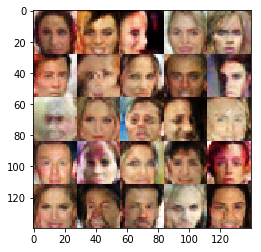

Epoch 2/10| Step 8550| Discriminator Loss:1.03187| Generator Loss:0.68580| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8600| Discriminator Loss:1.14583| Generator Loss:0.80327| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8650| Discriminator Loss:1.77040| Generator Loss:0.35781| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8700| Discriminator Loss:1.46164| Generator Loss:0.37807| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8750| Discriminator Loss:1.58329| Generator Loss:0.44925| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8800| Discriminator Loss:1.50048| Generator Loss:0.44159| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8850| Discriminator Loss:1.29164| Generator Loss:0.61207| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8900| Discriminator Loss:2.16318| Generator Loss:0.15633| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 8950| Discriminator Loss:1.63061| Generator Loss:0.38903| Discr

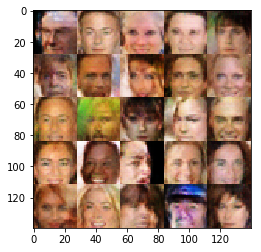

Epoch 2/10| Step 9050| Discriminator Loss:1.46802| Generator Loss:0.59242| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9100| Discriminator Loss:0.18254| Generator Loss:2.43569| Discriminator Loss>Generator Loss: False
Epoch 2/10| Step 9150| Discriminator Loss:1.08788| Generator Loss:0.87083| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9200| Discriminator Loss:1.77196| Generator Loss:0.33038| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9250| Discriminator Loss:1.76200| Generator Loss:0.26171| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9300| Discriminator Loss:1.36127| Generator Loss:0.44637| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9350| Discriminator Loss:1.43261| Generator Loss:0.40863| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9400| Discriminator Loss:1.12191| Generator Loss:0.64403| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9450| Discriminator Loss:1.65995| Generator Loss:0.34563| Disc

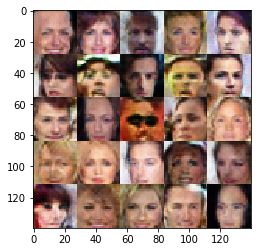

Epoch 2/10| Step 9550| Discriminator Loss:1.73102| Generator Loss:0.27562| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9600| Discriminator Loss:1.48656| Generator Loss:0.43939| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9650| Discriminator Loss:1.73505| Generator Loss:0.27048| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9700| Discriminator Loss:1.76412| Generator Loss:0.24866| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9750| Discriminator Loss:1.33699| Generator Loss:0.45254| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9800| Discriminator Loss:1.26838| Generator Loss:0.46255| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9850| Discriminator Loss:1.70782| Generator Loss:0.41927| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9900| Discriminator Loss:1.98700| Generator Loss:0.21117| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 9950| Discriminator Loss:2.41236| Generator Loss:0.12283| Discr

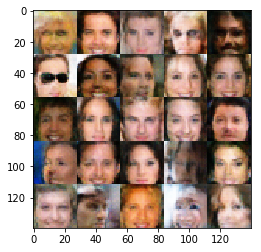

Epoch 2/10| Step 10050| Discriminator Loss:1.11033| Generator Loss:0.56522| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10100| Discriminator Loss:1.42976| Generator Loss:1.76840| Discriminator Loss>Generator Loss: False
Epoch 2/10| Step 10150| Discriminator Loss:1.17788| Generator Loss:0.68369| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10200| Discriminator Loss:1.77525| Generator Loss:0.26024| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10250| Discriminator Loss:1.41896| Generator Loss:0.47825| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10300| Discriminator Loss:1.54512| Generator Loss:0.33446| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10350| Discriminator Loss:0.82124| Generator Loss:0.93892| Discriminator Loss>Generator Loss: False
Epoch 2/10| Step 10400| Discriminator Loss:0.84367| Generator Loss:1.29697| Discriminator Loss>Generator Loss: False
Epoch 2/10| Step 10450| Discriminator Loss:1.72419| Generator Loss:0.

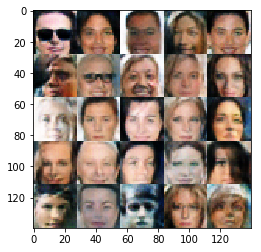

Epoch 2/10| Step 10550| Discriminator Loss:1.27964| Generator Loss:0.57525| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10600| Discriminator Loss:1.13218| Generator Loss:0.69391| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10650| Discriminator Loss:1.22140| Generator Loss:0.52161| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10700| Discriminator Loss:0.78973| Generator Loss:0.77406| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10750| Discriminator Loss:1.30486| Generator Loss:0.55543| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10800| Discriminator Loss:0.65726| Generator Loss:0.97391| Discriminator Loss>Generator Loss: False
Epoch 2/10| Step 10850| Discriminator Loss:1.72509| Generator Loss:0.24305| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10900| Discriminator Loss:1.58199| Generator Loss:0.36667| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 10950| Discriminator Loss:1.46402| Generator Loss:0.57

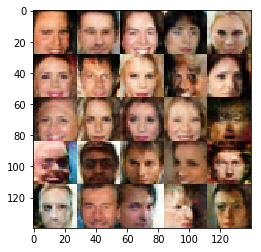

Epoch 2/10| Step 11050| Discriminator Loss:1.44351| Generator Loss:0.33269| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11100| Discriminator Loss:1.63410| Generator Loss:0.59648| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11150| Discriminator Loss:1.14574| Generator Loss:0.49363| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11200| Discriminator Loss:1.13971| Generator Loss:0.46308| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11250| Discriminator Loss:1.42391| Generator Loss:0.42740| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11300| Discriminator Loss:1.93330| Generator Loss:1.66558| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11350| Discriminator Loss:1.13664| Generator Loss:0.45655| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11400| Discriminator Loss:1.42502| Generator Loss:0.44473| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11450| Discriminator Loss:0.41344| Generator Loss:1.381

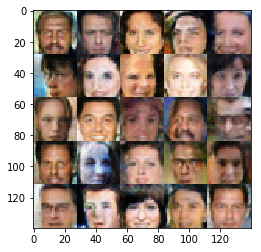

Epoch 2/10| Step 11550| Discriminator Loss:1.40480| Generator Loss:0.38890| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11600| Discriminator Loss:1.69404| Generator Loss:0.43534| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11650| Discriminator Loss:1.13324| Generator Loss:0.56839| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11700| Discriminator Loss:1.13454| Generator Loss:0.53250| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11750| Discriminator Loss:1.40984| Generator Loss:0.42160| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11800| Discriminator Loss:1.11765| Generator Loss:0.47664| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11850| Discriminator Loss:1.41408| Generator Loss:0.63642| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11900| Discriminator Loss:2.25810| Generator Loss:0.16597| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 11950| Discriminator Loss:0.60259| Generator Loss:1.005

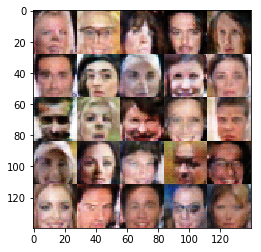

Epoch 2/10| Step 12050| Discriminator Loss:0.87371| Generator Loss:0.86645| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12100| Discriminator Loss:1.62643| Generator Loss:0.35278| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12150| Discriminator Loss:1.02584| Generator Loss:0.60150| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12200| Discriminator Loss:1.37736| Generator Loss:0.42737| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12250| Discriminator Loss:1.28793| Generator Loss:0.40623| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12300| Discriminator Loss:1.76406| Generator Loss:0.26873| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12350| Discriminator Loss:1.21588| Generator Loss:0.45367| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12400| Discriminator Loss:1.77669| Generator Loss:0.23386| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12450| Discriminator Loss:1.26376| Generator Loss:0.564

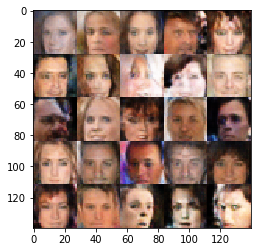

Epoch 2/10| Step 12550| Discriminator Loss:1.61867| Generator Loss:0.37862| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12600| Discriminator Loss:1.33814| Generator Loss:0.50148| Discriminator Loss>Generator Loss: True
Epoch 2/10| Step 12650| Discriminator Loss:1.45271| Generator Loss:0.39411| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 12700| Discriminator Loss:1.22064| Generator Loss:0.73498| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 12750| Discriminator Loss:1.08202| Generator Loss:0.79198| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 12800| Discriminator Loss:1.10402| Generator Loss:0.56394| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 12850| Discriminator Loss:1.09021| Generator Loss:0.56296| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 12900| Discriminator Loss:0.99430| Generator Loss:0.73949| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 12950| Discriminator Loss:1.75321| Generator Loss:0.573

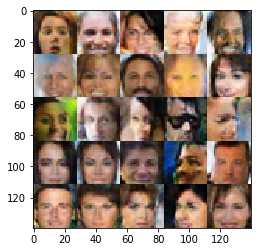

Epoch 3/10| Step 13050| Discriminator Loss:0.84242| Generator Loss:0.70156| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13100| Discriminator Loss:1.23252| Generator Loss:0.45390| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13150| Discriminator Loss:1.76613| Generator Loss:0.48521| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13200| Discriminator Loss:1.18417| Generator Loss:0.60429| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13250| Discriminator Loss:1.51414| Generator Loss:0.41433| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13300| Discriminator Loss:0.92519| Generator Loss:0.74633| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13350| Discriminator Loss:1.33143| Generator Loss:0.35185| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13400| Discriminator Loss:2.04748| Generator Loss:0.15422| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13450| Discriminator Loss:0.80301| Generator Loss:0.926

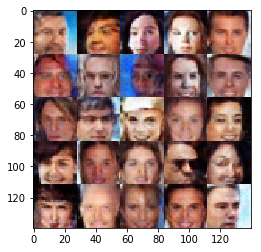

Epoch 3/10| Step 13550| Discriminator Loss:1.08432| Generator Loss:0.53181| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13600| Discriminator Loss:1.28521| Generator Loss:0.55535| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13650| Discriminator Loss:1.14349| Generator Loss:0.76992| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13700| Discriminator Loss:1.67268| Generator Loss:0.29382| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13750| Discriminator Loss:1.21030| Generator Loss:0.48004| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13800| Discriminator Loss:1.23373| Generator Loss:0.51776| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13850| Discriminator Loss:0.10427| Generator Loss:3.95767| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 13900| Discriminator Loss:1.08606| Generator Loss:0.58551| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 13950| Discriminator Loss:1.11068| Generator Loss:0.76

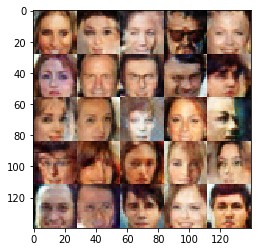

Epoch 3/10| Step 14050| Discriminator Loss:1.96100| Generator Loss:0.28696| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14100| Discriminator Loss:1.78034| Generator Loss:0.24437| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14150| Discriminator Loss:1.54958| Generator Loss:0.32242| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14200| Discriminator Loss:1.55287| Generator Loss:0.29519| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14250| Discriminator Loss:1.15775| Generator Loss:0.65539| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14300| Discriminator Loss:1.17307| Generator Loss:0.51289| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14350| Discriminator Loss:1.45494| Generator Loss:0.32906| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14400| Discriminator Loss:1.68197| Generator Loss:0.26064| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14450| Discriminator Loss:0.88232| Generator Loss:0.766

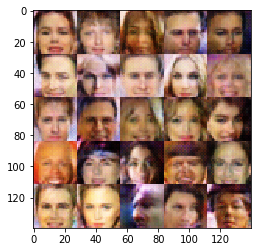

Epoch 3/10| Step 14550| Discriminator Loss:1.95083| Generator Loss:0.22429| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14600| Discriminator Loss:1.25063| Generator Loss:0.41668| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14650| Discriminator Loss:0.95362| Generator Loss:0.54422| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14700| Discriminator Loss:0.97594| Generator Loss:0.56087| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14750| Discriminator Loss:0.47274| Generator Loss:1.91341| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 14800| Discriminator Loss:1.18744| Generator Loss:0.63571| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 14850| Discriminator Loss:0.09410| Generator Loss:3.44239| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 14900| Discriminator Loss:0.68542| Generator Loss:1.37306| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 14950| Discriminator Loss:1.44063| Generator Loss:0.

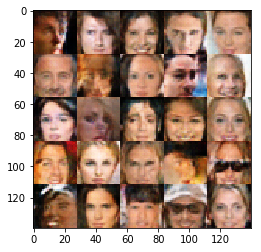

Epoch 3/10| Step 15050| Discriminator Loss:1.47489| Generator Loss:0.37297| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15100| Discriminator Loss:1.31685| Generator Loss:0.48694| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15150| Discriminator Loss:1.50284| Generator Loss:0.36295| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15200| Discriminator Loss:1.64267| Generator Loss:0.44019| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15250| Discriminator Loss:1.81458| Generator Loss:0.30665| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15300| Discriminator Loss:3.25543| Generator Loss:0.05797| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15350| Discriminator Loss:1.65939| Generator Loss:0.28161| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15400| Discriminator Loss:0.74469| Generator Loss:1.07125| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 15450| Discriminator Loss:1.01937| Generator Loss:0.58

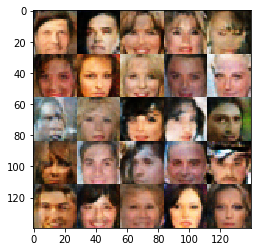

Epoch 3/10| Step 15550| Discriminator Loss:1.65277| Generator Loss:0.31349| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15600| Discriminator Loss:1.10159| Generator Loss:0.52047| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15650| Discriminator Loss:1.07148| Generator Loss:0.75801| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15700| Discriminator Loss:1.37763| Generator Loss:0.43150| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15750| Discriminator Loss:2.02823| Generator Loss:0.18783| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15800| Discriminator Loss:1.65821| Generator Loss:0.36534| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15850| Discriminator Loss:0.41317| Generator Loss:1.23969| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 15900| Discriminator Loss:1.00271| Generator Loss:0.61912| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 15950| Discriminator Loss:1.42684| Generator Loss:0.45

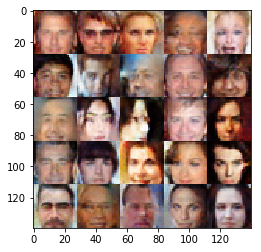

Epoch 3/10| Step 16050| Discriminator Loss:0.76589| Generator Loss:0.81133| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 16100| Discriminator Loss:1.14092| Generator Loss:0.52589| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16150| Discriminator Loss:1.93885| Generator Loss:0.18077| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16200| Discriminator Loss:1.58231| Generator Loss:0.27033| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16250| Discriminator Loss:3.19911| Generator Loss:1.10814| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16300| Discriminator Loss:1.40103| Generator Loss:0.48263| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16350| Discriminator Loss:0.30549| Generator Loss:1.93349| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 16400| Discriminator Loss:1.87695| Generator Loss:0.26028| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16450| Discriminator Loss:0.97323| Generator Loss:0.6

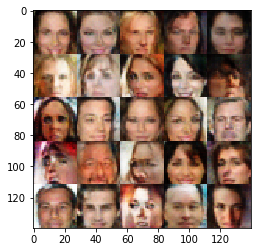

Epoch 3/10| Step 16550| Discriminator Loss:1.25616| Generator Loss:0.66070| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16600| Discriminator Loss:1.24034| Generator Loss:0.44954| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16650| Discriminator Loss:1.51099| Generator Loss:0.35479| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16700| Discriminator Loss:0.56191| Generator Loss:1.52891| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 16750| Discriminator Loss:1.68154| Generator Loss:0.33107| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16800| Discriminator Loss:0.71449| Generator Loss:0.74638| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 16850| Discriminator Loss:1.02847| Generator Loss:0.67749| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 16900| Discriminator Loss:0.27005| Generator Loss:1.66634| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 16950| Discriminator Loss:1.36471| Generator Loss:0.

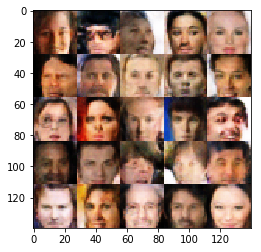

Epoch 3/10| Step 17050| Discriminator Loss:1.56007| Generator Loss:0.39244| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17100| Discriminator Loss:1.09543| Generator Loss:0.62425| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17150| Discriminator Loss:1.19059| Generator Loss:0.59317| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17200| Discriminator Loss:1.13468| Generator Loss:0.94890| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17250| Discriminator Loss:1.26392| Generator Loss:0.53491| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17300| Discriminator Loss:1.46831| Generator Loss:0.35024| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17350| Discriminator Loss:0.78872| Generator Loss:0.87299| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 17400| Discriminator Loss:1.59388| Generator Loss:0.30738| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17450| Discriminator Loss:0.40075| Generator Loss:1.20

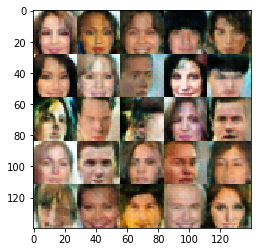

Epoch 3/10| Step 17550| Discriminator Loss:1.33377| Generator Loss:0.80057| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17600| Discriminator Loss:1.12114| Generator Loss:0.59790| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17650| Discriminator Loss:1.19488| Generator Loss:0.69548| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17700| Discriminator Loss:1.09574| Generator Loss:0.52646| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17750| Discriminator Loss:1.36127| Generator Loss:0.46799| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17800| Discriminator Loss:1.51785| Generator Loss:0.33025| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17850| Discriminator Loss:2.47236| Generator Loss:0.12778| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17900| Discriminator Loss:0.78985| Generator Loss:0.68828| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 17950| Discriminator Loss:0.77265| Generator Loss:0.826

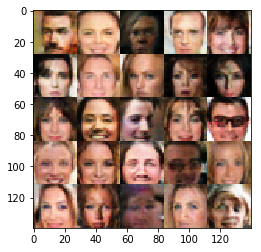

Epoch 3/10| Step 18050| Discriminator Loss:2.11451| Generator Loss:0.17178| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18100| Discriminator Loss:0.17892| Generator Loss:2.23445| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 18150| Discriminator Loss:0.81261| Generator Loss:0.97037| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 18200| Discriminator Loss:0.90872| Generator Loss:0.61177| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18250| Discriminator Loss:2.54139| Generator Loss:0.09809| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18300| Discriminator Loss:0.91861| Generator Loss:0.70079| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18350| Discriminator Loss:1.22173| Generator Loss:0.45725| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18400| Discriminator Loss:1.69111| Generator Loss:0.31913| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18450| Discriminator Loss:1.41412| Generator Loss:0.5

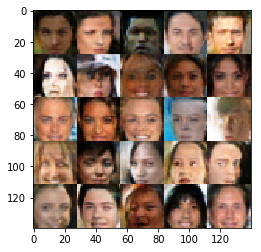

Epoch 3/10| Step 18550| Discriminator Loss:1.95387| Generator Loss:0.20711| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18600| Discriminator Loss:2.17060| Generator Loss:0.15903| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18650| Discriminator Loss:0.81185| Generator Loss:0.83359| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 18700| Discriminator Loss:1.16773| Generator Loss:0.47243| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18750| Discriminator Loss:0.90261| Generator Loss:0.77445| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18800| Discriminator Loss:0.61724| Generator Loss:0.97854| Discriminator Loss>Generator Loss: False
Epoch 3/10| Step 18850| Discriminator Loss:1.27260| Generator Loss:0.41717| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18900| Discriminator Loss:1.54728| Generator Loss:0.35060| Discriminator Loss>Generator Loss: True
Epoch 3/10| Step 18950| Discriminator Loss:0.73452| Generator Loss:3.9

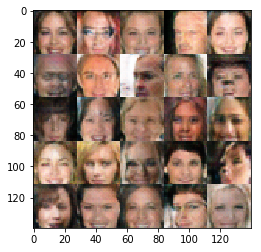

Epoch 4/10| Step 19050| Discriminator Loss:0.90109| Generator Loss:0.72646| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19100| Discriminator Loss:1.48673| Generator Loss:0.37874| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19150| Discriminator Loss:1.13008| Generator Loss:0.49346| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19200| Discriminator Loss:0.97486| Generator Loss:0.61747| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19250| Discriminator Loss:1.24814| Generator Loss:0.43402| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19300| Discriminator Loss:0.23372| Generator Loss:2.59943| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 19350| Discriminator Loss:1.48007| Generator Loss:0.33609| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19400| Discriminator Loss:2.45253| Generator Loss:0.12572| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19450| Discriminator Loss:1.00365| Generator Loss:0.56

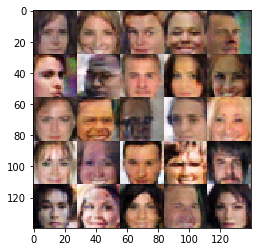

Epoch 4/10| Step 19550| Discriminator Loss:2.54753| Generator Loss:0.09361| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19600| Discriminator Loss:1.74009| Generator Loss:0.21353| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19650| Discriminator Loss:1.07849| Generator Loss:0.67764| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19700| Discriminator Loss:0.05296| Generator Loss:3.50641| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 19750| Discriminator Loss:0.91120| Generator Loss:0.72468| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19800| Discriminator Loss:1.44178| Generator Loss:0.33118| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19850| Discriminator Loss:0.87606| Generator Loss:0.63924| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 19900| Discriminator Loss:0.60338| Generator Loss:1.41219| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 19950| Discriminator Loss:0.12098| Generator Loss:4.0

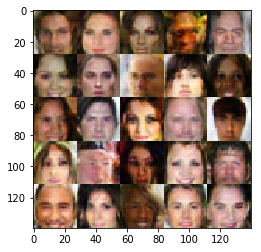

Epoch 4/10| Step 20050| Discriminator Loss:0.77726| Generator Loss:0.78952| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 20100| Discriminator Loss:1.36025| Generator Loss:0.34837| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20150| Discriminator Loss:1.02560| Generator Loss:0.65035| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20200| Discriminator Loss:0.86400| Generator Loss:1.08913| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 20250| Discriminator Loss:2.88064| Generator Loss:0.07130| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20300| Discriminator Loss:0.66049| Generator Loss:0.85474| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 20350| Discriminator Loss:2.06374| Generator Loss:0.16603| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20400| Discriminator Loss:0.13037| Generator Loss:2.34948| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 20450| Discriminator Loss:1.30769| Generator Loss:0

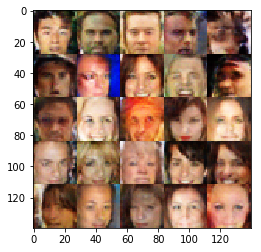

Epoch 4/10| Step 20550| Discriminator Loss:1.83736| Generator Loss:0.25308| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20600| Discriminator Loss:1.45060| Generator Loss:0.35294| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20650| Discriminator Loss:1.04731| Generator Loss:0.92386| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20700| Discriminator Loss:0.96934| Generator Loss:0.60620| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20750| Discriminator Loss:1.87856| Generator Loss:0.18551| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20800| Discriminator Loss:1.16927| Generator Loss:0.45249| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20850| Discriminator Loss:1.52031| Generator Loss:0.28930| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20900| Discriminator Loss:0.81897| Generator Loss:0.69269| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 20950| Discriminator Loss:0.99224| Generator Loss:0.566

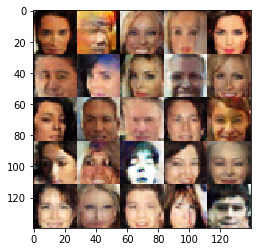

Epoch 4/10| Step 21050| Discriminator Loss:1.88779| Generator Loss:0.19590| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21100| Discriminator Loss:1.59996| Generator Loss:0.45171| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21150| Discriminator Loss:1.34599| Generator Loss:0.40976| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21200| Discriminator Loss:0.14436| Generator Loss:2.45637| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 21250| Discriminator Loss:1.33489| Generator Loss:0.38962| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21300| Discriminator Loss:1.02649| Generator Loss:0.52962| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21350| Discriminator Loss:1.16351| Generator Loss:0.48028| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21400| Discriminator Loss:0.31853| Generator Loss:2.02988| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 21450| Discriminator Loss:0.08881| Generator Loss:2.7

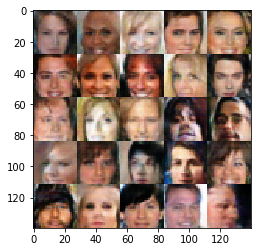

Epoch 4/10| Step 21550| Discriminator Loss:0.24481| Generator Loss:1.86566| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 21600| Discriminator Loss:1.69675| Generator Loss:0.25197| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21650| Discriminator Loss:0.90339| Generator Loss:0.74030| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21700| Discriminator Loss:1.21656| Generator Loss:0.46955| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21750| Discriminator Loss:1.56798| Generator Loss:0.26781| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21800| Discriminator Loss:1.35830| Generator Loss:0.40942| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21850| Discriminator Loss:0.98483| Generator Loss:1.14504| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 21900| Discriminator Loss:1.39290| Generator Loss:0.43061| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 21950| Discriminator Loss:1.20488| Generator Loss:0.5

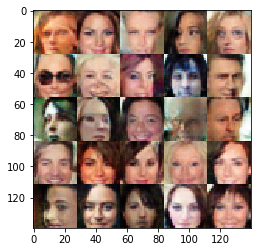

Epoch 4/10| Step 22050| Discriminator Loss:1.36568| Generator Loss:0.37298| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22100| Discriminator Loss:1.40493| Generator Loss:1.06323| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22150| Discriminator Loss:0.45486| Generator Loss:1.53663| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 22200| Discriminator Loss:1.51825| Generator Loss:0.30560| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22250| Discriminator Loss:1.39361| Generator Loss:0.37775| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22300| Discriminator Loss:2.20603| Generator Loss:0.15668| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22350| Discriminator Loss:0.67724| Generator Loss:0.93220| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 22400| Discriminator Loss:0.12402| Generator Loss:2.43742| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 22450| Discriminator Loss:0.92181| Generator Loss:0.

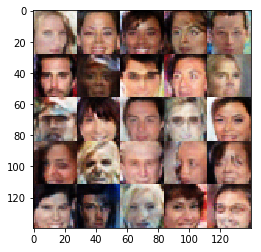

Epoch 4/10| Step 22550| Discriminator Loss:0.79048| Generator Loss:0.74333| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22600| Discriminator Loss:2.19624| Generator Loss:0.20572| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22650| Discriminator Loss:2.04469| Generator Loss:0.23689| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22700| Discriminator Loss:1.16774| Generator Loss:0.46919| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22750| Discriminator Loss:1.52565| Generator Loss:0.32051| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22800| Discriminator Loss:1.00294| Generator Loss:0.65768| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22850| Discriminator Loss:1.39025| Generator Loss:0.37599| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22900| Discriminator Loss:0.97057| Generator Loss:0.68128| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 22950| Discriminator Loss:1.10379| Generator Loss:0.746

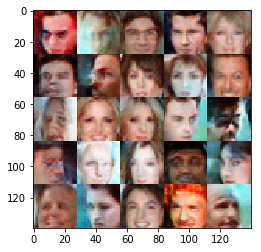

Epoch 4/10| Step 23050| Discriminator Loss:1.68785| Generator Loss:0.44476| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23100| Discriminator Loss:1.16652| Generator Loss:0.56610| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23150| Discriminator Loss:1.19848| Generator Loss:0.44678| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23200| Discriminator Loss:1.20458| Generator Loss:0.44580| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23250| Discriminator Loss:0.08391| Generator Loss:3.68362| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 23300| Discriminator Loss:0.45248| Generator Loss:1.34060| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 23350| Discriminator Loss:1.73633| Generator Loss:0.24078| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23400| Discriminator Loss:0.62693| Generator Loss:1.02249| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 23450| Discriminator Loss:1.01477| Generator Loss:0.

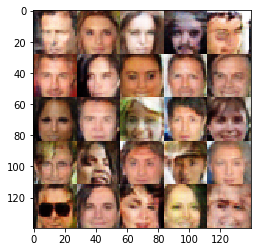

Epoch 4/10| Step 23550| Discriminator Loss:0.03236| Generator Loss:3.82836| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 23600| Discriminator Loss:1.76943| Generator Loss:0.28878| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23650| Discriminator Loss:2.16963| Generator Loss:0.22336| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23700| Discriminator Loss:1.98103| Generator Loss:0.18919| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23750| Discriminator Loss:0.16232| Generator Loss:2.33309| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 23800| Discriminator Loss:0.71260| Generator Loss:1.41850| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 23850| Discriminator Loss:1.48396| Generator Loss:0.39733| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23900| Discriminator Loss:0.82258| Generator Loss:0.78014| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 23950| Discriminator Loss:1.10968| Generator Loss:0.

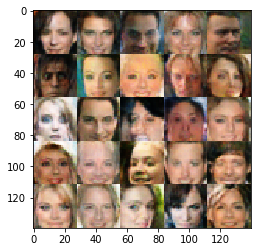

Epoch 4/10| Step 24050| Discriminator Loss:1.76563| Generator Loss:0.22717| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24100| Discriminator Loss:1.54051| Generator Loss:0.42299| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24150| Discriminator Loss:1.73574| Generator Loss:0.26933| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24200| Discriminator Loss:1.05703| Generator Loss:0.52800| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24250| Discriminator Loss:0.89902| Generator Loss:0.62616| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24300| Discriminator Loss:1.40587| Generator Loss:0.39684| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24350| Discriminator Loss:0.99500| Generator Loss:0.63002| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24400| Discriminator Loss:1.23452| Generator Loss:0.46524| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24450| Discriminator Loss:1.41267| Generator Loss:0.335

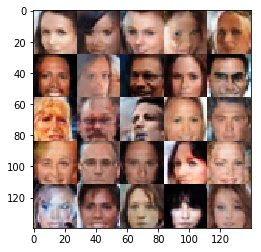

Epoch 4/10| Step 24550| Discriminator Loss:1.22735| Generator Loss:0.45598| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24600| Discriminator Loss:1.56833| Generator Loss:0.28101| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24650| Discriminator Loss:0.02733| Generator Loss:3.82417| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 24700| Discriminator Loss:0.06266| Generator Loss:3.14275| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 24750| Discriminator Loss:0.81827| Generator Loss:1.14573| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 24800| Discriminator Loss:0.31905| Generator Loss:2.35070| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 24850| Discriminator Loss:1.10405| Generator Loss:0.46614| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24900| Discriminator Loss:1.38108| Generator Loss:0.39881| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 24950| Discriminator Loss:1.18881| Generator Loss:0

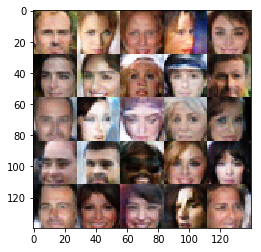

Epoch 4/10| Step 25050| Discriminator Loss:1.25613| Generator Loss:0.38497| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 25100| Discriminator Loss:1.43833| Generator Loss:0.34648| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 25150| Discriminator Loss:1.30827| Generator Loss:0.42879| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 25200| Discriminator Loss:1.35807| Generator Loss:0.39185| Discriminator Loss>Generator Loss: True
Epoch 4/10| Step 25250| Discriminator Loss:0.56842| Generator Loss:1.21353| Discriminator Loss>Generator Loss: False
Epoch 4/10| Step 25300| Discriminator Loss:1.59872| Generator Loss:0.31125| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25350| Discriminator Loss:1.16961| Generator Loss:0.50420| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25400| Discriminator Loss:1.99011| Generator Loss:0.21649| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25450| Discriminator Loss:1.80866| Generator Loss:0.21

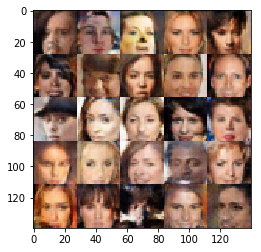

Epoch 5/10| Step 25550| Discriminator Loss:1.07029| Generator Loss:0.55331| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25600| Discriminator Loss:1.49277| Generator Loss:0.33018| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25650| Discriminator Loss:1.06542| Generator Loss:0.59462| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25700| Discriminator Loss:1.90952| Generator Loss:0.23869| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25750| Discriminator Loss:3.25244| Generator Loss:0.05639| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25800| Discriminator Loss:2.06221| Generator Loss:0.18033| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25850| Discriminator Loss:0.49989| Generator Loss:1.26485| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 25900| Discriminator Loss:1.05128| Generator Loss:0.46487| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 25950| Discriminator Loss:1.42165| Generator Loss:0.35

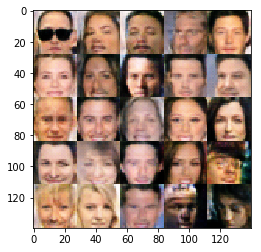

Epoch 5/10| Step 26050| Discriminator Loss:0.90317| Generator Loss:0.72746| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26100| Discriminator Loss:0.78194| Generator Loss:0.80999| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 26150| Discriminator Loss:0.65332| Generator Loss:0.91273| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 26200| Discriminator Loss:1.90193| Generator Loss:0.19633| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26250| Discriminator Loss:0.95018| Generator Loss:0.68443| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26300| Discriminator Loss:1.16925| Generator Loss:0.56718| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26350| Discriminator Loss:2.42307| Generator Loss:0.11584| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26400| Discriminator Loss:1.11213| Generator Loss:0.78837| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26450| Discriminator Loss:0.57262| Generator Loss:0.9

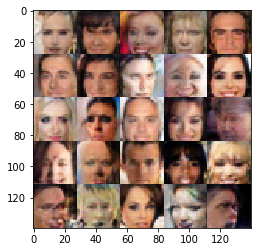

Epoch 5/10| Step 26550| Discriminator Loss:0.37820| Generator Loss:1.24778| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 26600| Discriminator Loss:0.59974| Generator Loss:1.17381| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 26650| Discriminator Loss:1.70079| Generator Loss:0.25431| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26700| Discriminator Loss:1.28797| Generator Loss:0.39353| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26750| Discriminator Loss:1.11056| Generator Loss:0.52854| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26800| Discriminator Loss:1.29532| Generator Loss:0.41240| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26850| Discriminator Loss:0.10461| Generator Loss:2.61180| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 26900| Discriminator Loss:1.31052| Generator Loss:0.40942| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 26950| Discriminator Loss:0.13768| Generator Loss:2.

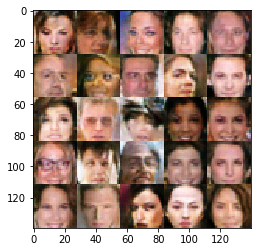

Epoch 5/10| Step 27050| Discriminator Loss:0.18612| Generator Loss:2.10056| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 27100| Discriminator Loss:0.45294| Generator Loss:1.18002| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 27150| Discriminator Loss:1.21543| Generator Loss:0.44517| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27200| Discriminator Loss:1.26356| Generator Loss:0.43122| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27250| Discriminator Loss:1.18200| Generator Loss:0.89892| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27300| Discriminator Loss:1.70638| Generator Loss:0.25701| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27350| Discriminator Loss:2.12563| Generator Loss:0.19203| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27400| Discriminator Loss:1.36446| Generator Loss:0.36761| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27450| Discriminator Loss:0.74397| Generator Loss:0.8

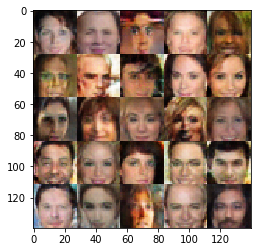

Epoch 5/10| Step 27550| Discriminator Loss:1.63437| Generator Loss:0.28963| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27600| Discriminator Loss:2.17348| Generator Loss:0.14264| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27650| Discriminator Loss:0.17703| Generator Loss:2.12475| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 27700| Discriminator Loss:1.01661| Generator Loss:0.62263| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27750| Discriminator Loss:1.60775| Generator Loss:0.26353| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27800| Discriminator Loss:1.54644| Generator Loss:0.35053| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27850| Discriminator Loss:1.04328| Generator Loss:0.58999| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 27900| Discriminator Loss:0.14354| Generator Loss:2.19723| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 27950| Discriminator Loss:1.46513| Generator Loss:0.3

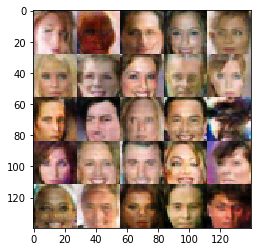

Epoch 5/10| Step 28050| Discriminator Loss:0.67014| Generator Loss:1.01392| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 28100| Discriminator Loss:0.72248| Generator Loss:0.74831| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 28150| Discriminator Loss:0.89325| Generator Loss:0.68266| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28200| Discriminator Loss:0.99722| Generator Loss:0.89170| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28250| Discriminator Loss:0.93681| Generator Loss:0.83097| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28300| Discriminator Loss:0.90535| Generator Loss:0.62461| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28350| Discriminator Loss:2.12433| Generator Loss:0.17228| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28400| Discriminator Loss:2.39607| Generator Loss:0.12515| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28450| Discriminator Loss:0.89528| Generator Loss:0.6

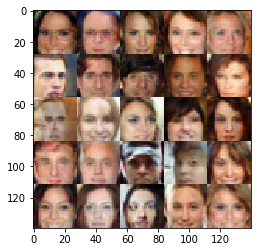

Epoch 5/10| Step 28550| Discriminator Loss:1.25966| Generator Loss:0.42446| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28600| Discriminator Loss:1.95573| Generator Loss:0.18559| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28650| Discriminator Loss:0.50414| Generator Loss:1.39130| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 28700| Discriminator Loss:1.28279| Generator Loss:0.64541| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28750| Discriminator Loss:3.13051| Generator Loss:0.06133| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28800| Discriminator Loss:2.25260| Generator Loss:0.13877| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28850| Discriminator Loss:1.39551| Generator Loss:0.32938| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28900| Discriminator Loss:1.29582| Generator Loss:0.41950| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 28950| Discriminator Loss:0.94546| Generator Loss:0.57

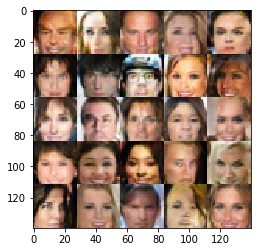

Epoch 5/10| Step 29050| Discriminator Loss:0.76787| Generator Loss:0.74959| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29100| Discriminator Loss:1.92829| Generator Loss:0.19618| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29150| Discriminator Loss:0.77813| Generator Loss:0.75240| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29200| Discriminator Loss:1.14815| Generator Loss:0.45836| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29250| Discriminator Loss:0.59315| Generator Loss:1.00907| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29300| Discriminator Loss:0.61617| Generator Loss:1.05730| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29350| Discriminator Loss:0.40735| Generator Loss:1.25336| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29400| Discriminator Loss:0.36938| Generator Loss:1.65652| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29450| Discriminator Loss:1.68888| Generator Loss:0

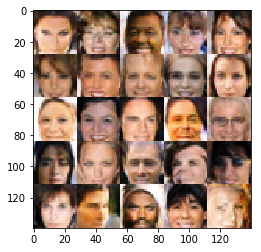

Epoch 5/10| Step 29550| Discriminator Loss:0.84595| Generator Loss:1.02642| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29600| Discriminator Loss:1.34064| Generator Loss:0.37503| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29650| Discriminator Loss:1.36656| Generator Loss:0.36191| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29700| Discriminator Loss:2.01018| Generator Loss:0.20346| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29750| Discriminator Loss:0.88209| Generator Loss:0.80666| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29800| Discriminator Loss:0.34920| Generator Loss:1.40440| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29850| Discriminator Loss:0.65928| Generator Loss:0.89223| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 29900| Discriminator Loss:1.25119| Generator Loss:1.04061| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 29950| Discriminator Loss:2.53806| Generator Loss:0.

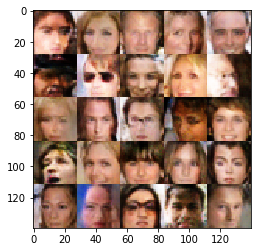

Epoch 5/10| Step 30050| Discriminator Loss:0.36041| Generator Loss:1.59851| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30100| Discriminator Loss:0.77578| Generator Loss:0.81100| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30150| Discriminator Loss:0.13530| Generator Loss:2.60144| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30200| Discriminator Loss:1.03821| Generator Loss:0.49951| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 30250| Discriminator Loss:1.55916| Generator Loss:0.31213| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 30300| Discriminator Loss:0.24275| Generator Loss:1.77924| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30350| Discriminator Loss:0.05396| Generator Loss:3.44770| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30400| Discriminator Loss:2.23500| Generator Loss:0.13097| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 30450| Discriminator Loss:0.79332| Generator Loss:

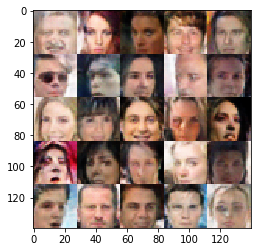

Epoch 5/10| Step 30550| Discriminator Loss:1.95198| Generator Loss:0.20258| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 30600| Discriminator Loss:2.19394| Generator Loss:0.15036| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 30650| Discriminator Loss:0.65774| Generator Loss:0.85484| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30700| Discriminator Loss:0.70846| Generator Loss:0.98116| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30750| Discriminator Loss:0.97488| Generator Loss:0.58436| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 30800| Discriminator Loss:0.62919| Generator Loss:0.90439| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30850| Discriminator Loss:0.19052| Generator Loss:2.07435| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30900| Discriminator Loss:0.29560| Generator Loss:1.54241| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 30950| Discriminator Loss:1.32907| Generator Loss:

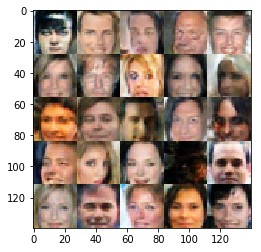

Epoch 5/10| Step 31050| Discriminator Loss:1.03385| Generator Loss:0.53832| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31100| Discriminator Loss:1.91296| Generator Loss:0.19706| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31150| Discriminator Loss:1.25444| Generator Loss:0.40904| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31200| Discriminator Loss:1.08509| Generator Loss:0.61870| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31250| Discriminator Loss:0.98725| Generator Loss:1.10807| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 31300| Discriminator Loss:0.40365| Generator Loss:1.42696| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 31350| Discriminator Loss:1.31428| Generator Loss:0.40371| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31400| Discriminator Loss:0.94749| Generator Loss:0.66946| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31450| Discriminator Loss:1.50189| Generator Loss:0.3

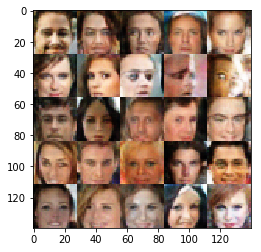

Epoch 5/10| Step 31550| Discriminator Loss:1.27948| Generator Loss:0.67810| Discriminator Loss>Generator Loss: True
Epoch 5/10| Step 31600| Discriminator Loss:0.48237| Generator Loss:1.17591| Discriminator Loss>Generator Loss: False
Epoch 5/10| Step 31650| Discriminator Loss:0.82518| Generator Loss:1.05374| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 31700| Discriminator Loss:0.96245| Generator Loss:0.67068| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 31750| Discriminator Loss:1.35374| Generator Loss:0.40822| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 31800| Discriminator Loss:0.27511| Generator Loss:1.57245| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 31850| Discriminator Loss:0.97014| Generator Loss:0.60661| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 31900| Discriminator Loss:0.84800| Generator Loss:0.69153| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 31950| Discriminator Loss:1.36317| Generator Loss:0.

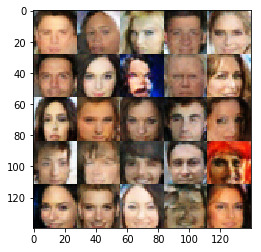

Epoch 6/10| Step 32050| Discriminator Loss:1.58929| Generator Loss:0.28645| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32100| Discriminator Loss:2.65002| Generator Loss:0.09661| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32150| Discriminator Loss:1.34061| Generator Loss:0.39549| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32200| Discriminator Loss:0.64011| Generator Loss:1.14079| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 32250| Discriminator Loss:0.73746| Generator Loss:1.51472| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 32300| Discriminator Loss:1.09749| Generator Loss:0.46974| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32350| Discriminator Loss:1.38738| Generator Loss:0.35567| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32400| Discriminator Loss:2.20806| Generator Loss:0.16305| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32450| Discriminator Loss:1.58794| Generator Loss:0.2

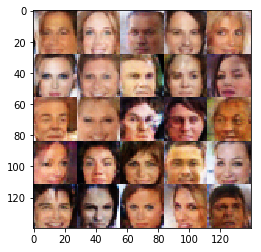

Epoch 6/10| Step 32550| Discriminator Loss:1.42719| Generator Loss:0.28687| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32600| Discriminator Loss:0.89751| Generator Loss:0.69274| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32650| Discriminator Loss:1.80470| Generator Loss:0.29378| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32700| Discriminator Loss:1.26084| Generator Loss:0.54359| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32750| Discriminator Loss:1.26846| Generator Loss:0.55437| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32800| Discriminator Loss:1.03098| Generator Loss:0.53146| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32850| Discriminator Loss:2.58319| Generator Loss:0.09608| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 32900| Discriminator Loss:0.50736| Generator Loss:1.12156| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 32950| Discriminator Loss:1.79852| Generator Loss:0.22

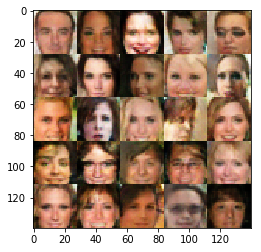

Epoch 6/10| Step 33050| Discriminator Loss:1.70529| Generator Loss:0.29642| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33100| Discriminator Loss:0.37423| Generator Loss:1.56236| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33150| Discriminator Loss:1.98995| Generator Loss:0.23363| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33200| Discriminator Loss:0.45404| Generator Loss:1.26132| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33250| Discriminator Loss:1.87408| Generator Loss:0.23695| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33300| Discriminator Loss:1.74821| Generator Loss:0.24958| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33350| Discriminator Loss:0.75657| Generator Loss:0.71902| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33400| Discriminator Loss:1.54673| Generator Loss:0.29326| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33450| Discriminator Loss:0.92417| Generator Loss:1.0

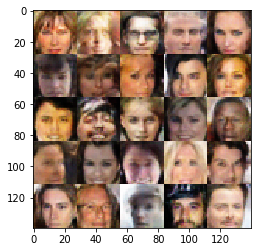

Epoch 6/10| Step 33550| Discriminator Loss:0.52223| Generator Loss:1.40891| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33600| Discriminator Loss:0.29547| Generator Loss:1.49543| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33650| Discriminator Loss:0.06261| Generator Loss:3.36007| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33700| Discriminator Loss:0.84292| Generator Loss:0.84596| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33750| Discriminator Loss:0.62539| Generator Loss:0.98290| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33800| Discriminator Loss:0.76110| Generator Loss:0.71079| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33850| Discriminator Loss:0.46839| Generator Loss:2.27925| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 33900| Discriminator Loss:0.89346| Generator Loss:0.66720| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 33950| Discriminator Loss:0.40607| Generator Loss

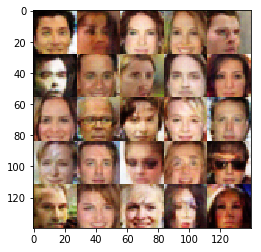

Epoch 6/10| Step 34050| Discriminator Loss:0.72867| Generator Loss:1.05797| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34100| Discriminator Loss:0.82180| Generator Loss:0.77629| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34150| Discriminator Loss:0.37697| Generator Loss:1.91915| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34200| Discriminator Loss:0.37251| Generator Loss:4.35838| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34250| Discriminator Loss:0.04090| Generator Loss:3.92990| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34300| Discriminator Loss:0.07617| Generator Loss:3.12161| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34350| Discriminator Loss:0.15680| Generator Loss:2.53810| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34400| Discriminator Loss:1.56988| Generator Loss:0.30135| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34450| Discriminator Loss:1.48432| Generator Loss

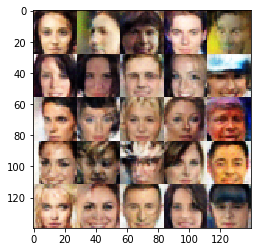

Epoch 6/10| Step 34550| Discriminator Loss:1.18256| Generator Loss:0.40369| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34600| Discriminator Loss:0.80569| Generator Loss:0.73937| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34650| Discriminator Loss:0.42741| Generator Loss:1.46078| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34700| Discriminator Loss:0.32800| Generator Loss:1.64365| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 34750| Discriminator Loss:2.31477| Generator Loss:0.13813| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34800| Discriminator Loss:2.24269| Generator Loss:0.15853| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34850| Discriminator Loss:1.33128| Generator Loss:0.44927| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34900| Discriminator Loss:0.86315| Generator Loss:0.67723| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 34950| Discriminator Loss:2.73185| Generator Loss:0.0

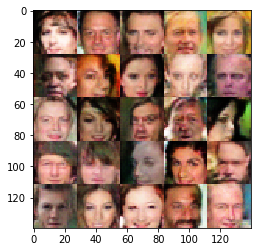

Epoch 6/10| Step 35050| Discriminator Loss:0.84484| Generator Loss:1.39277| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 35100| Discriminator Loss:1.64780| Generator Loss:0.35651| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35150| Discriminator Loss:0.81609| Generator Loss:0.87265| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 35200| Discriminator Loss:2.05059| Generator Loss:0.17098| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35250| Discriminator Loss:1.01108| Generator Loss:0.63305| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35300| Discriminator Loss:1.31533| Generator Loss:0.39861| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35350| Discriminator Loss:1.38287| Generator Loss:0.46658| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35400| Discriminator Loss:0.47799| Generator Loss:1.11114| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 35450| Discriminator Loss:2.07689| Generator Loss:0.

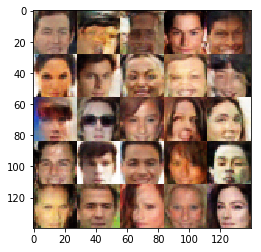

Epoch 6/10| Step 35550| Discriminator Loss:1.63905| Generator Loss:0.27285| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35600| Discriminator Loss:1.45624| Generator Loss:0.38273| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35650| Discriminator Loss:0.94200| Generator Loss:0.64564| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35700| Discriminator Loss:1.03892| Generator Loss:0.57094| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35750| Discriminator Loss:1.68662| Generator Loss:0.23168| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35800| Discriminator Loss:1.32233| Generator Loss:0.44036| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35850| Discriminator Loss:2.33679| Generator Loss:0.14874| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35900| Discriminator Loss:1.92801| Generator Loss:0.19252| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 35950| Discriminator Loss:1.70171| Generator Loss:0.268

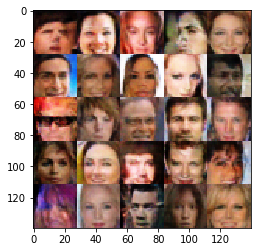

Epoch 6/10| Step 36050| Discriminator Loss:1.72438| Generator Loss:0.26839| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36100| Discriminator Loss:2.66101| Generator Loss:0.10303| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36150| Discriminator Loss:1.63156| Generator Loss:0.29970| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36200| Discriminator Loss:0.43386| Generator Loss:1.16558| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 36250| Discriminator Loss:0.84150| Generator Loss:0.70832| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36300| Discriminator Loss:1.91447| Generator Loss:0.19165| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36350| Discriminator Loss:1.03941| Generator Loss:0.59533| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36400| Discriminator Loss:0.55923| Generator Loss:1.04054| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 36450| Discriminator Loss:0.11612| Generator Loss:2.4

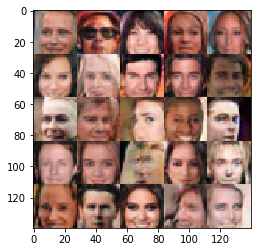

Epoch 6/10| Step 36550| Discriminator Loss:1.55143| Generator Loss:0.30278| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36600| Discriminator Loss:7.51034| Generator Loss:0.00133| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36650| Discriminator Loss:0.06571| Generator Loss:5.31944| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 36700| Discriminator Loss:0.91885| Generator Loss:0.90285| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36750| Discriminator Loss:1.16629| Generator Loss:0.44009| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36800| Discriminator Loss:2.06571| Generator Loss:0.17231| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36850| Discriminator Loss:0.13212| Generator Loss:2.76998| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 36900| Discriminator Loss:1.04873| Generator Loss:0.58694| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 36950| Discriminator Loss:1.37741| Generator Loss:0.3

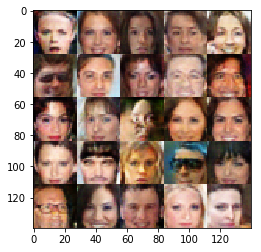

Epoch 6/10| Step 37050| Discriminator Loss:0.29694| Generator Loss:1.94515| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37100| Discriminator Loss:1.35226| Generator Loss:0.35696| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37150| Discriminator Loss:0.19066| Generator Loss:1.97957| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37200| Discriminator Loss:0.23958| Generator Loss:1.78272| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37250| Discriminator Loss:3.45895| Generator Loss:0.04637| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37300| Discriminator Loss:0.99252| Generator Loss:0.57644| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37350| Discriminator Loss:1.16798| Generator Loss:0.56555| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37400| Discriminator Loss:0.21137| Generator Loss:1.91589| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37450| Discriminator Loss:0.72782| Generator Loss:0

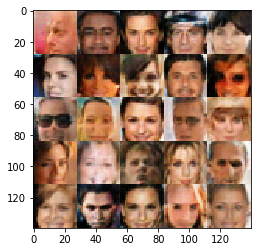

Epoch 6/10| Step 37550| Discriminator Loss:0.48461| Generator Loss:1.10014| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37600| Discriminator Loss:0.85236| Generator Loss:0.70300| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37650| Discriminator Loss:2.02423| Generator Loss:0.19690| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37700| Discriminator Loss:0.70102| Generator Loss:0.88998| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37750| Discriminator Loss:1.37072| Generator Loss:0.37607| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37800| Discriminator Loss:1.89655| Generator Loss:0.22992| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37850| Discriminator Loss:0.08947| Generator Loss:2.73480| Discriminator Loss>Generator Loss: False
Epoch 6/10| Step 37900| Discriminator Loss:3.15709| Generator Loss:0.05840| Discriminator Loss>Generator Loss: True
Epoch 6/10| Step 37950| Discriminator Loss:1.29053| Generator Loss:0.

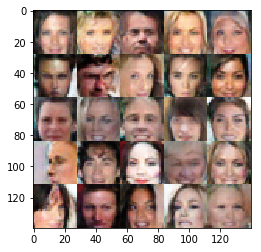

Epoch 7/10| Step 38050| Discriminator Loss:1.44144| Generator Loss:0.33332| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38100| Discriminator Loss:1.66965| Generator Loss:0.28213| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38150| Discriminator Loss:1.76502| Generator Loss:0.25788| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38200| Discriminator Loss:1.77545| Generator Loss:0.24900| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38250| Discriminator Loss:1.55707| Generator Loss:0.31206| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38300| Discriminator Loss:1.82981| Generator Loss:0.26831| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38350| Discriminator Loss:1.13720| Generator Loss:0.48871| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38400| Discriminator Loss:2.24946| Generator Loss:0.14713| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38450| Discriminator Loss:1.50308| Generator Loss:0.325

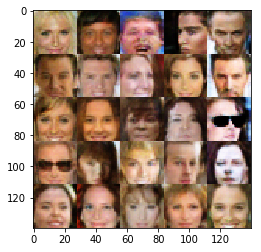

Epoch 7/10| Step 38550| Discriminator Loss:1.14797| Generator Loss:0.47686| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38600| Discriminator Loss:0.60274| Generator Loss:1.14035| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 38650| Discriminator Loss:1.52722| Generator Loss:0.32285| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38700| Discriminator Loss:0.94811| Generator Loss:0.92035| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38750| Discriminator Loss:1.83445| Generator Loss:0.29310| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38800| Discriminator Loss:1.85250| Generator Loss:0.25513| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38850| Discriminator Loss:0.98293| Generator Loss:0.67631| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 38900| Discriminator Loss:0.77962| Generator Loss:0.96936| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 38950| Discriminator Loss:0.99923| Generator Loss:0.9

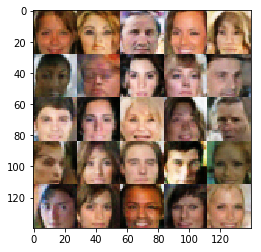

Epoch 7/10| Step 39050| Discriminator Loss:1.59990| Generator Loss:0.30252| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39100| Discriminator Loss:0.95148| Generator Loss:0.82440| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39150| Discriminator Loss:1.84017| Generator Loss:0.20940| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39200| Discriminator Loss:0.08778| Generator Loss:2.73102| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 39250| Discriminator Loss:1.81908| Generator Loss:0.24070| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39300| Discriminator Loss:0.75954| Generator Loss:0.76953| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 39350| Discriminator Loss:0.90733| Generator Loss:0.71784| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39400| Discriminator Loss:3.46419| Generator Loss:0.09159| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39450| Discriminator Loss:0.01938| Generator Loss:4.2

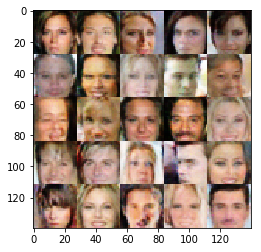

Epoch 7/10| Step 39550| Discriminator Loss:0.24828| Generator Loss:2.22149| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 39600| Discriminator Loss:1.68701| Generator Loss:0.26335| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39650| Discriminator Loss:1.04573| Generator Loss:0.72538| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39700| Discriminator Loss:1.38417| Generator Loss:0.40746| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39750| Discriminator Loss:0.28921| Generator Loss:1.63841| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 39800| Discriminator Loss:0.95758| Generator Loss:0.84650| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39850| Discriminator Loss:0.87572| Generator Loss:0.72965| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39900| Discriminator Loss:1.51886| Generator Loss:0.30287| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 39950| Discriminator Loss:0.20903| Generator Loss:1.9

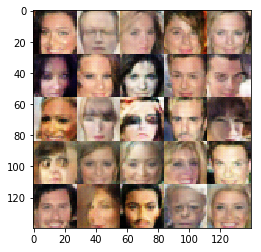

Epoch 7/10| Step 40050| Discriminator Loss:0.90137| Generator Loss:0.64014| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40100| Discriminator Loss:1.20145| Generator Loss:0.52186| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40150| Discriminator Loss:2.06739| Generator Loss:0.20008| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40200| Discriminator Loss:0.86549| Generator Loss:0.67588| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40250| Discriminator Loss:2.52506| Generator Loss:0.12081| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40300| Discriminator Loss:0.88852| Generator Loss:0.61649| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40350| Discriminator Loss:1.33176| Generator Loss:0.41330| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40400| Discriminator Loss:1.05339| Generator Loss:0.69108| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40450| Discriminator Loss:0.48260| Generator Loss:1.267

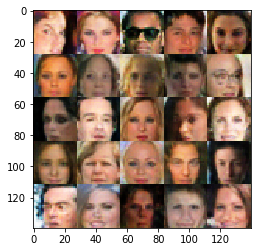

Epoch 7/10| Step 40550| Discriminator Loss:2.11862| Generator Loss:0.18691| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40600| Discriminator Loss:1.56022| Generator Loss:0.30625| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40650| Discriminator Loss:2.27207| Generator Loss:0.13145| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40700| Discriminator Loss:1.89471| Generator Loss:0.20128| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40750| Discriminator Loss:1.18654| Generator Loss:0.51656| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 40800| Discriminator Loss:0.01577| Generator Loss:5.36787| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 40850| Discriminator Loss:0.19804| Generator Loss:2.13727| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 40900| Discriminator Loss:0.72142| Generator Loss:0.89760| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 40950| Discriminator Loss:0.04402| Generator Loss:3.

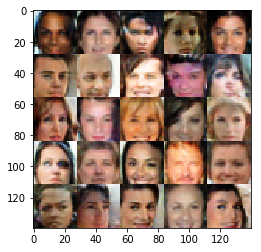

Epoch 7/10| Step 41050| Discriminator Loss:1.47567| Generator Loss:0.42220| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41100| Discriminator Loss:0.03601| Generator Loss:4.52477| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41150| Discriminator Loss:1.93801| Generator Loss:0.32111| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41200| Discriminator Loss:1.00611| Generator Loss:0.59960| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41250| Discriminator Loss:1.08421| Generator Loss:0.54168| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41300| Discriminator Loss:0.01062| Generator Loss:4.74694| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41350| Discriminator Loss:0.17186| Generator Loss:2.52311| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41400| Discriminator Loss:0.62037| Generator Loss:1.02631| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41450| Discriminator Loss:1.11035| Generator Loss:0

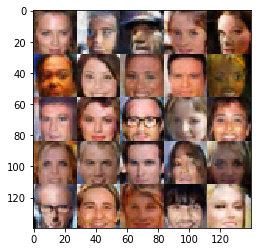

Epoch 7/10| Step 41550| Discriminator Loss:0.87056| Generator Loss:0.64246| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41600| Discriminator Loss:0.77635| Generator Loss:0.73216| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41650| Discriminator Loss:0.21869| Generator Loss:1.84243| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41700| Discriminator Loss:0.11130| Generator Loss:2.66026| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41750| Discriminator Loss:1.03074| Generator Loss:0.57264| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41800| Discriminator Loss:0.85390| Generator Loss:0.76676| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41850| Discriminator Loss:0.67331| Generator Loss:0.84195| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 41900| Discriminator Loss:1.61808| Generator Loss:0.28340| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 41950| Discriminator Loss:0.39955| Generator Loss:1.

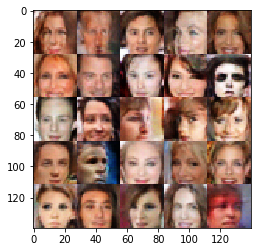

Epoch 7/10| Step 42050| Discriminator Loss:0.86505| Generator Loss:0.72373| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42100| Discriminator Loss:1.88653| Generator Loss:0.20527| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42150| Discriminator Loss:2.85042| Generator Loss:0.07584| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42200| Discriminator Loss:0.10224| Generator Loss:2.64120| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 42250| Discriminator Loss:1.73683| Generator Loss:0.31455| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42300| Discriminator Loss:1.24631| Generator Loss:0.45806| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42350| Discriminator Loss:1.08237| Generator Loss:0.51753| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42400| Discriminator Loss:2.01738| Generator Loss:0.18321| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42450| Discriminator Loss:0.80477| Generator Loss:1.98

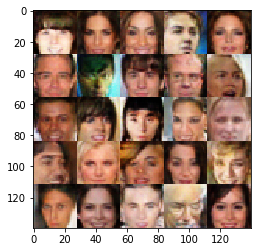

Epoch 7/10| Step 42550| Discriminator Loss:1.64109| Generator Loss:0.26060| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42600| Discriminator Loss:0.85437| Generator Loss:0.72682| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42650| Discriminator Loss:1.11623| Generator Loss:0.48227| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42700| Discriminator Loss:1.97746| Generator Loss:0.20710| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42750| Discriminator Loss:0.40414| Generator Loss:1.37201| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 42800| Discriminator Loss:1.45987| Generator Loss:0.33830| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42850| Discriminator Loss:0.84179| Generator Loss:0.78005| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42900| Discriminator Loss:2.55123| Generator Loss:0.23485| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 42950| Discriminator Loss:1.06953| Generator Loss:0.55

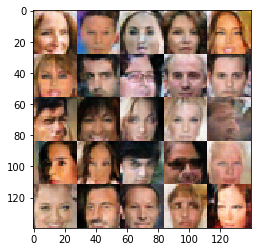

Epoch 7/10| Step 43050| Discriminator Loss:1.63611| Generator Loss:0.28211| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43100| Discriminator Loss:1.77257| Generator Loss:0.23680| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43150| Discriminator Loss:2.16371| Generator Loss:0.15413| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43200| Discriminator Loss:0.81261| Generator Loss:0.79531| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43250| Discriminator Loss:2.83856| Generator Loss:0.09304| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43300| Discriminator Loss:1.46729| Generator Loss:0.35580| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43350| Discriminator Loss:2.74507| Generator Loss:0.09217| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43400| Discriminator Loss:1.11992| Generator Loss:0.50790| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43450| Discriminator Loss:1.50114| Generator Loss:0.303

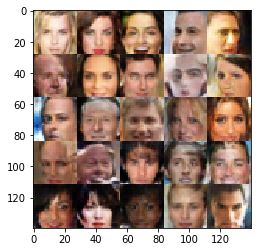

Epoch 7/10| Step 43550| Discriminator Loss:1.31128| Generator Loss:0.40952| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43600| Discriminator Loss:1.01234| Generator Loss:0.54335| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43650| Discriminator Loss:1.13071| Generator Loss:0.54449| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43700| Discriminator Loss:1.12421| Generator Loss:1.04938| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43750| Discriminator Loss:1.81601| Generator Loss:0.21772| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43800| Discriminator Loss:0.05856| Generator Loss:3.85583| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 43850| Discriminator Loss:1.37281| Generator Loss:0.34325| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 43900| Discriminator Loss:0.29686| Generator Loss:1.45755| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 43950| Discriminator Loss:1.61362| Generator Loss:0.3

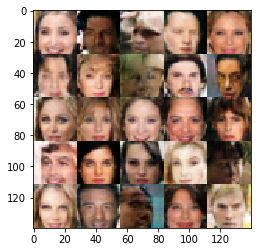

Epoch 7/10| Step 44050| Discriminator Loss:1.21060| Generator Loss:0.48631| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 44100| Discriminator Loss:1.31649| Generator Loss:0.39594| Discriminator Loss>Generator Loss: True
Epoch 7/10| Step 44150| Discriminator Loss:0.63317| Generator Loss:2.22000| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 44200| Discriminator Loss:0.74638| Generator Loss:0.78507| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 44250| Discriminator Loss:0.79441| Generator Loss:3.59349| Discriminator Loss>Generator Loss: False
Epoch 7/10| Step 44300| Discriminator Loss:2.25801| Generator Loss:0.12520| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44350| Discriminator Loss:2.00840| Generator Loss:0.26402| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44400| Discriminator Loss:1.92029| Generator Loss:0.21271| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44450| Discriminator Loss:1.03025| Generator Loss:0.

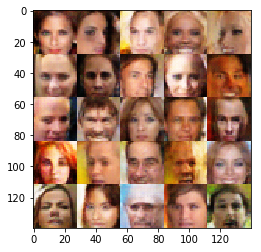

Epoch 8/10| Step 44550| Discriminator Loss:0.38641| Generator Loss:1.40522| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 44600| Discriminator Loss:1.36678| Generator Loss:0.42142| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44650| Discriminator Loss:1.76860| Generator Loss:0.22469| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44700| Discriminator Loss:0.09429| Generator Loss:2.89749| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 44750| Discriminator Loss:2.45769| Generator Loss:0.10888| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44800| Discriminator Loss:1.75410| Generator Loss:0.24798| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44850| Discriminator Loss:0.94939| Generator Loss:0.64090| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44900| Discriminator Loss:2.19887| Generator Loss:0.16123| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 44950| Discriminator Loss:0.95269| Generator Loss:0.5

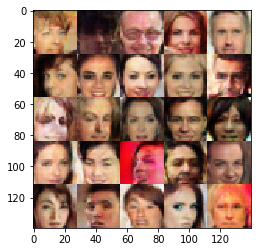

Epoch 8/10| Step 45050| Discriminator Loss:2.58629| Generator Loss:0.20674| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45100| Discriminator Loss:0.68711| Generator Loss:0.90885| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45150| Discriminator Loss:0.71963| Generator Loss:1.55203| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45200| Discriminator Loss:2.55572| Generator Loss:0.10315| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45250| Discriminator Loss:2.59124| Generator Loss:0.13520| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45300| Discriminator Loss:2.49795| Generator Loss:0.14095| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45350| Discriminator Loss:1.91165| Generator Loss:0.19010| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45400| Discriminator Loss:0.93588| Generator Loss:0.64680| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45450| Discriminator Loss:1.12253| Generator Loss:0.4

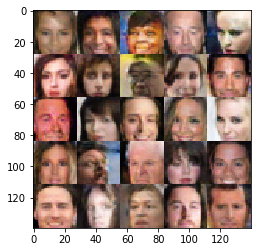

Epoch 8/10| Step 45550| Discriminator Loss:1.17105| Generator Loss:0.56018| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45600| Discriminator Loss:0.37186| Generator Loss:1.90386| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45650| Discriminator Loss:0.76851| Generator Loss:0.77195| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45700| Discriminator Loss:0.70233| Generator Loss:0.93898| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45750| Discriminator Loss:2.66812| Generator Loss:0.12166| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45800| Discriminator Loss:0.00643| Generator Loss:6.22512| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45850| Discriminator Loss:0.47697| Generator Loss:1.20008| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 45900| Discriminator Loss:1.00610| Generator Loss:0.58446| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 45950| Discriminator Loss:2.23306| Generator Loss:

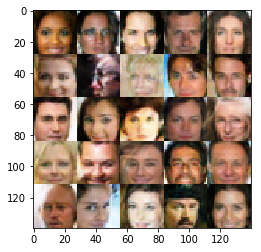

Epoch 8/10| Step 46050| Discriminator Loss:2.22523| Generator Loss:0.17878| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46100| Discriminator Loss:1.30966| Generator Loss:0.38022| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46150| Discriminator Loss:1.53906| Generator Loss:0.32168| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46200| Discriminator Loss:2.32623| Generator Loss:0.13977| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46250| Discriminator Loss:0.47991| Generator Loss:1.09919| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46300| Discriminator Loss:1.35511| Generator Loss:0.42182| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46350| Discriminator Loss:0.44729| Generator Loss:1.28346| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46400| Discriminator Loss:0.62842| Generator Loss:1.12001| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46450| Discriminator Loss:0.76902| Generator Loss:0.

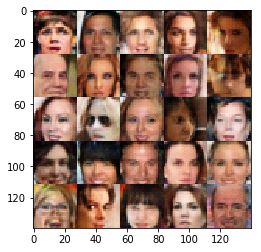

Epoch 8/10| Step 46550| Discriminator Loss:0.02920| Generator Loss:5.45755| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46600| Discriminator Loss:0.02846| Generator Loss:3.97374| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46650| Discriminator Loss:0.04266| Generator Loss:3.44486| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46700| Discriminator Loss:0.09753| Generator Loss:2.92983| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46750| Discriminator Loss:0.59172| Generator Loss:1.14069| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46800| Discriminator Loss:0.87074| Generator Loss:1.41456| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 46850| Discriminator Loss:0.88149| Generator Loss:0.69228| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46900| Discriminator Loss:1.06534| Generator Loss:0.54364| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 46950| Discriminator Loss:1.13930| Generator Loss

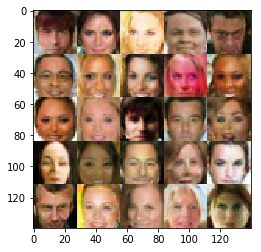

Epoch 8/10| Step 47050| Discriminator Loss:0.60792| Generator Loss:2.42667| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 47100| Discriminator Loss:1.40360| Generator Loss:0.37225| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47150| Discriminator Loss:2.23377| Generator Loss:0.18159| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47200| Discriminator Loss:1.25301| Generator Loss:0.44410| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47250| Discriminator Loss:1.55104| Generator Loss:0.35062| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47300| Discriminator Loss:2.24975| Generator Loss:0.19208| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47350| Discriminator Loss:2.25264| Generator Loss:0.15024| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47400| Discriminator Loss:0.69220| Generator Loss:0.77232| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 47450| Discriminator Loss:1.98400| Generator Loss:0.2

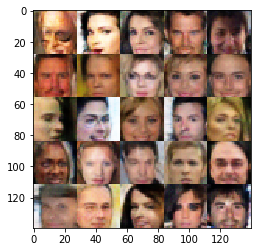

Epoch 8/10| Step 47550| Discriminator Loss:0.45536| Generator Loss:1.37981| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 47600| Discriminator Loss:2.64557| Generator Loss:0.12600| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47650| Discriminator Loss:0.38532| Generator Loss:1.30858| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 47700| Discriminator Loss:0.03538| Generator Loss:3.57084| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 47750| Discriminator Loss:1.46591| Generator Loss:0.36887| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47800| Discriminator Loss:0.98384| Generator Loss:0.59296| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47850| Discriminator Loss:1.30770| Generator Loss:0.40347| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 47900| Discriminator Loss:0.65087| Generator Loss:0.93457| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 47950| Discriminator Loss:0.11870| Generator Loss:2

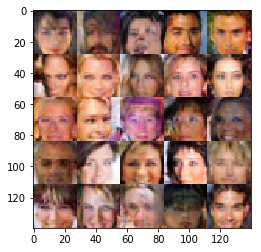

Epoch 8/10| Step 48050| Discriminator Loss:1.10434| Generator Loss:0.50633| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48100| Discriminator Loss:2.55910| Generator Loss:0.12204| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48150| Discriminator Loss:2.91349| Generator Loss:0.07951| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48200| Discriminator Loss:0.74272| Generator Loss:0.73235| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48250| Discriminator Loss:1.80260| Generator Loss:0.25889| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48300| Discriminator Loss:1.25593| Generator Loss:0.37732| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48350| Discriminator Loss:2.19370| Generator Loss:0.13900| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48400| Discriminator Loss:1.45498| Generator Loss:0.34671| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48450| Discriminator Loss:1.79592| Generator Loss:0.267

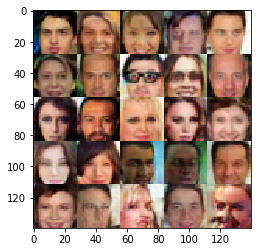

Epoch 8/10| Step 48550| Discriminator Loss:2.46152| Generator Loss:0.16367| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48600| Discriminator Loss:1.84173| Generator Loss:0.21767| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48650| Discriminator Loss:2.21140| Generator Loss:0.15737| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48700| Discriminator Loss:0.34553| Generator Loss:1.74898| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 48750| Discriminator Loss:2.12515| Generator Loss:0.15818| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48800| Discriminator Loss:0.56261| Generator Loss:0.98912| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 48850| Discriminator Loss:2.04894| Generator Loss:0.18340| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48900| Discriminator Loss:0.88397| Generator Loss:0.65353| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 48950| Discriminator Loss:1.51227| Generator Loss:0.2

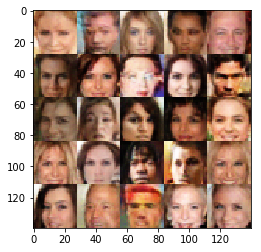

Epoch 8/10| Step 49050| Discriminator Loss:1.53902| Generator Loss:0.28882| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49100| Discriminator Loss:8.19139| Generator Loss:0.00067| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49150| Discriminator Loss:1.24346| Generator Loss:0.51546| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49200| Discriminator Loss:0.66984| Generator Loss:0.97376| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 49250| Discriminator Loss:1.33097| Generator Loss:0.35881| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49300| Discriminator Loss:1.39428| Generator Loss:0.44913| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49350| Discriminator Loss:1.06215| Generator Loss:0.49099| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49400| Discriminator Loss:0.63538| Generator Loss:1.02978| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 49450| Discriminator Loss:1.77415| Generator Loss:0.2

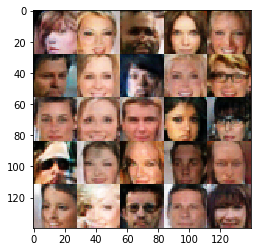

Epoch 8/10| Step 49550| Discriminator Loss:0.88204| Generator Loss:0.64607| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49600| Discriminator Loss:0.89565| Generator Loss:0.67834| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49650| Discriminator Loss:1.81647| Generator Loss:0.24931| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49700| Discriminator Loss:2.26456| Generator Loss:0.14975| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49750| Discriminator Loss:2.37146| Generator Loss:0.16103| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49800| Discriminator Loss:1.64977| Generator Loss:0.28044| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49850| Discriminator Loss:3.52573| Generator Loss:0.03605| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 49900| Discriminator Loss:0.30864| Generator Loss:1.53900| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 49950| Discriminator Loss:0.67271| Generator Loss:0.93

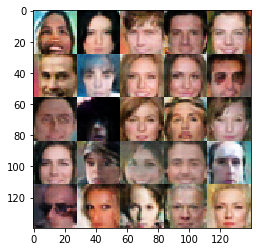

Epoch 8/10| Step 50050| Discriminator Loss:1.33172| Generator Loss:0.41370| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 50100| Discriminator Loss:1.47898| Generator Loss:0.30838| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 50150| Discriminator Loss:0.10156| Generator Loss:2.51248| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 50200| Discriminator Loss:1.60525| Generator Loss:0.28780| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 50250| Discriminator Loss:0.90404| Generator Loss:0.74937| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 50300| Discriminator Loss:0.42540| Generator Loss:1.26955| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 50350| Discriminator Loss:1.20999| Generator Loss:0.53753| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 50400| Discriminator Loss:0.21951| Generator Loss:2.88293| Discriminator Loss>Generator Loss: False
Epoch 8/10| Step 50450| Discriminator Loss:0.22633| Generator Loss:2.

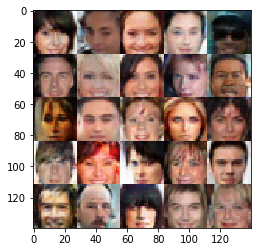

Epoch 8/10| Step 50550| Discriminator Loss:1.46233| Generator Loss:0.38152| Discriminator Loss>Generator Loss: True
Epoch 8/10| Step 50600| Discriminator Loss:0.92435| Generator Loss:0.66938| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 50650| Discriminator Loss:1.08313| Generator Loss:1.20308| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 50700| Discriminator Loss:1.14971| Generator Loss:0.47787| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 50750| Discriminator Loss:0.12421| Generator Loss:2.38696| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 50800| Discriminator Loss:1.29250| Generator Loss:0.54986| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 50850| Discriminator Loss:0.59870| Generator Loss:0.93691| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 50900| Discriminator Loss:0.95685| Generator Loss:0.64480| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 50950| Discriminator Loss:3.55239| Generator Loss:5.

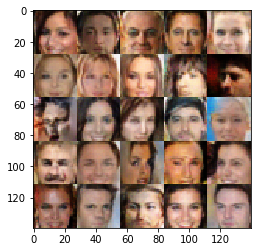

Epoch 9/10| Step 51050| Discriminator Loss:2.33254| Generator Loss:0.12762| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51100| Discriminator Loss:0.03120| Generator Loss:4.13215| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51150| Discriminator Loss:0.08217| Generator Loss:3.06404| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51200| Discriminator Loss:0.74818| Generator Loss:0.78129| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51250| Discriminator Loss:1.65961| Generator Loss:0.29440| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51300| Discriminator Loss:1.01288| Generator Loss:0.73510| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51350| Discriminator Loss:0.61381| Generator Loss:1.13874| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51400| Discriminator Loss:0.93369| Generator Loss:0.59482| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51450| Discriminator Loss:0.38814| Generator Loss:1

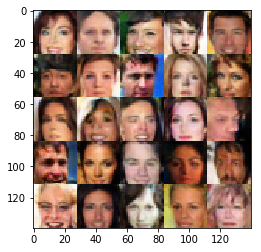

Epoch 9/10| Step 51550| Discriminator Loss:1.70288| Generator Loss:0.24367| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51600| Discriminator Loss:0.43911| Generator Loss:1.40025| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51650| Discriminator Loss:0.40489| Generator Loss:1.20403| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51700| Discriminator Loss:0.17687| Generator Loss:2.04024| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51750| Discriminator Loss:0.10331| Generator Loss:2.66289| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 51800| Discriminator Loss:1.99939| Generator Loss:0.26847| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51850| Discriminator Loss:3.98031| Generator Loss:0.02762| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51900| Discriminator Loss:1.07217| Generator Loss:0.48826| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 51950| Discriminator Loss:0.43025| Generator Loss:1

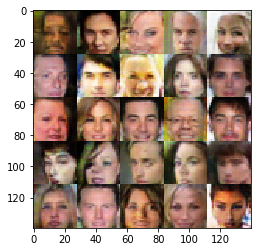

Epoch 9/10| Step 52050| Discriminator Loss:1.08271| Generator Loss:0.52828| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52100| Discriminator Loss:0.77951| Generator Loss:1.03752| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 52150| Discriminator Loss:5.01663| Generator Loss:0.00939| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52200| Discriminator Loss:0.95219| Generator Loss:2.82375| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 52250| Discriminator Loss:2.35891| Generator Loss:0.12789| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52300| Discriminator Loss:0.28150| Generator Loss:1.58974| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 52350| Discriminator Loss:0.96205| Generator Loss:0.60412| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52400| Discriminator Loss:2.44086| Generator Loss:0.13347| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52450| Discriminator Loss:1.58307| Generator Loss:0.

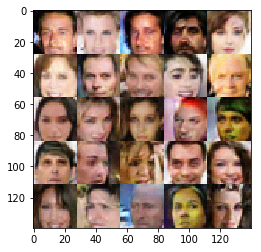

Epoch 9/10| Step 52550| Discriminator Loss:1.86648| Generator Loss:0.24115| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52600| Discriminator Loss:1.62684| Generator Loss:0.27646| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52650| Discriminator Loss:0.91098| Generator Loss:0.59493| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52700| Discriminator Loss:0.62200| Generator Loss:0.91715| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 52750| Discriminator Loss:0.16597| Generator Loss:2.19980| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 52800| Discriminator Loss:0.42104| Generator Loss:1.22325| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 52850| Discriminator Loss:1.75154| Generator Loss:0.28509| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52900| Discriminator Loss:1.47597| Generator Loss:0.37920| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 52950| Discriminator Loss:0.95919| Generator Loss:0.

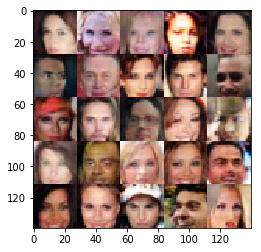

Epoch 9/10| Step 53050| Discriminator Loss:1.73744| Generator Loss:0.25415| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53100| Discriminator Loss:0.70780| Generator Loss:4.43400| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 53150| Discriminator Loss:1.67676| Generator Loss:0.26390| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53200| Discriminator Loss:0.16331| Generator Loss:2.18226| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 53250| Discriminator Loss:1.04348| Generator Loss:0.59004| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53300| Discriminator Loss:0.24774| Generator Loss:1.80932| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 53350| Discriminator Loss:1.42403| Generator Loss:0.32268| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53400| Discriminator Loss:1.07609| Generator Loss:0.50174| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53450| Discriminator Loss:0.81083| Generator Loss:0.

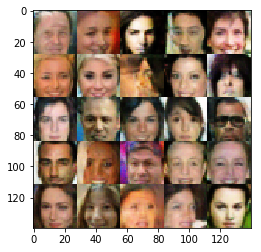

Epoch 9/10| Step 53550| Discriminator Loss:1.53584| Generator Loss:0.29150| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53600| Discriminator Loss:0.28442| Generator Loss:1.61069| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 53650| Discriminator Loss:1.40581| Generator Loss:0.34205| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53700| Discriminator Loss:1.67062| Generator Loss:0.26495| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53750| Discriminator Loss:0.09728| Generator Loss:3.29792| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 53800| Discriminator Loss:0.82687| Generator Loss:0.70904| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53850| Discriminator Loss:1.01322| Generator Loss:0.55779| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53900| Discriminator Loss:1.16214| Generator Loss:0.52280| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 53950| Discriminator Loss:3.21906| Generator Loss:0.0

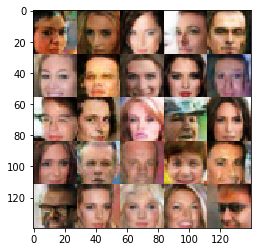

Epoch 9/10| Step 54050| Discriminator Loss:3.20033| Generator Loss:0.10212| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54100| Discriminator Loss:0.76313| Generator Loss:0.83620| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54150| Discriminator Loss:0.89555| Generator Loss:0.60190| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54200| Discriminator Loss:1.83236| Generator Loss:0.27447| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54250| Discriminator Loss:0.85535| Generator Loss:0.82950| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54300| Discriminator Loss:1.65664| Generator Loss:0.35457| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54350| Discriminator Loss:3.26576| Generator Loss:0.04958| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54400| Discriminator Loss:2.58687| Generator Loss:0.13388| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54450| Discriminator Loss:2.34291| Generator Loss:0.12

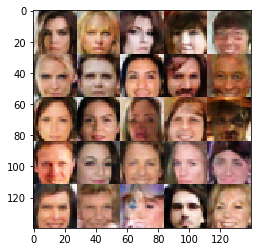

Epoch 9/10| Step 54550| Discriminator Loss:0.57132| Generator Loss:1.14592| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54600| Discriminator Loss:0.11511| Generator Loss:3.11212| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54650| Discriminator Loss:3.53213| Generator Loss:0.04991| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54700| Discriminator Loss:1.88636| Generator Loss:0.51704| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 54750| Discriminator Loss:0.21171| Generator Loss:1.87841| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54800| Discriminator Loss:0.05852| Generator Loss:3.21626| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54850| Discriminator Loss:0.50001| Generator Loss:1.79044| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54900| Discriminator Loss:0.90216| Generator Loss:1.26864| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 54950| Discriminator Loss:0.41196| Generator Loss

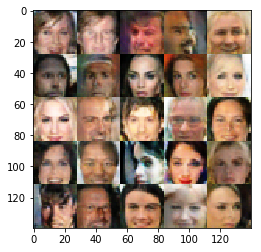

Epoch 9/10| Step 55050| Discriminator Loss:1.18685| Generator Loss:0.50469| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55100| Discriminator Loss:1.74930| Generator Loss:0.24610| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55150| Discriminator Loss:1.44537| Generator Loss:0.34681| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55200| Discriminator Loss:2.00083| Generator Loss:0.18797| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55250| Discriminator Loss:0.02325| Generator Loss:4.68373| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 55300| Discriminator Loss:0.87406| Generator Loss:0.86120| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55350| Discriminator Loss:1.10410| Generator Loss:0.50341| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55400| Discriminator Loss:1.88879| Generator Loss:0.19704| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55450| Discriminator Loss:2.03670| Generator Loss:0.25

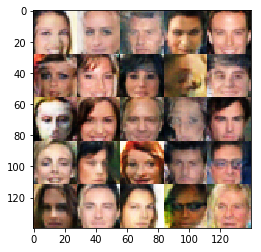

Epoch 9/10| Step 55550| Discriminator Loss:1.11241| Generator Loss:0.53242| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55600| Discriminator Loss:0.81462| Generator Loss:0.81731| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 55650| Discriminator Loss:0.86515| Generator Loss:0.68585| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55700| Discriminator Loss:0.47200| Generator Loss:1.26986| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 55750| Discriminator Loss:3.33094| Generator Loss:0.04895| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55800| Discriminator Loss:1.57284| Generator Loss:0.29828| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55850| Discriminator Loss:1.42013| Generator Loss:0.40570| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55900| Discriminator Loss:2.11644| Generator Loss:0.26132| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 55950| Discriminator Loss:1.45351| Generator Loss:0.3

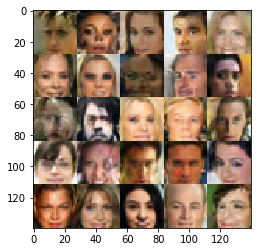

Epoch 9/10| Step 56050| Discriminator Loss:1.80112| Generator Loss:0.25410| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56100| Discriminator Loss:0.77664| Generator Loss:1.68079| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56150| Discriminator Loss:0.89151| Generator Loss:0.83709| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56200| Discriminator Loss:0.36942| Generator Loss:1.43146| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56250| Discriminator Loss:0.56814| Generator Loss:1.07768| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56300| Discriminator Loss:0.75712| Generator Loss:0.95765| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56350| Discriminator Loss:1.05505| Generator Loss:0.66194| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56400| Discriminator Loss:0.37575| Generator Loss:1.84734| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56450| Discriminator Loss:0.20891| Generator Loss:

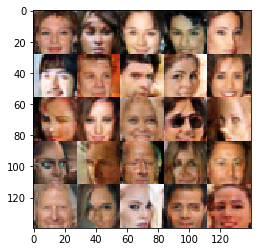

Epoch 9/10| Step 56550| Discriminator Loss:0.08869| Generator Loss:3.78798| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56600| Discriminator Loss:0.89541| Generator Loss:0.68494| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56650| Discriminator Loss:2.30284| Generator Loss:0.15239| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56700| Discriminator Loss:3.19383| Generator Loss:0.06205| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56750| Discriminator Loss:0.87012| Generator Loss:0.66320| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56800| Discriminator Loss:2.45495| Generator Loss:0.14536| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56850| Discriminator Loss:1.00903| Generator Loss:0.60447| Discriminator Loss>Generator Loss: True
Epoch 9/10| Step 56900| Discriminator Loss:0.66482| Generator Loss:0.89994| Discriminator Loss>Generator Loss: False
Epoch 9/10| Step 56950| Discriminator Loss:2.49855| Generator Loss:0.1

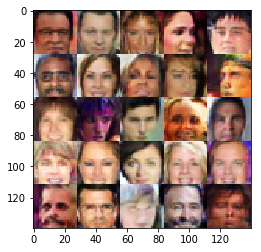

Epoch 10/10| Step 57050| Discriminator Loss:3.10572| Generator Loss:0.06650| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57100| Discriminator Loss:1.19375| Generator Loss:0.44102| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57150| Discriminator Loss:0.53260| Generator Loss:1.31562| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 57200| Discriminator Loss:1.90474| Generator Loss:0.20055| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57250| Discriminator Loss:2.03944| Generator Loss:0.30330| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57300| Discriminator Loss:0.86165| Generator Loss:0.60935| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57350| Discriminator Loss:0.88613| Generator Loss:0.84238| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57400| Discriminator Loss:0.64955| Generator Loss:0.91810| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 57450| Discriminator Loss:3.34536| Generator

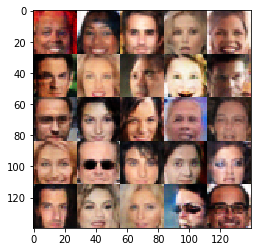

Epoch 10/10| Step 57550| Discriminator Loss:2.58205| Generator Loss:0.09749| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57600| Discriminator Loss:1.06977| Generator Loss:0.47698| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57650| Discriminator Loss:0.62918| Generator Loss:0.95911| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 57700| Discriminator Loss:1.20124| Generator Loss:0.46076| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57750| Discriminator Loss:0.25660| Generator Loss:1.75038| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 57800| Discriminator Loss:2.32651| Generator Loss:0.14245| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57850| Discriminator Loss:1.14358| Generator Loss:0.54982| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 57900| Discriminator Loss:0.30302| Generator Loss:1.52601| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 57950| Discriminator Loss:0.38518| Generato

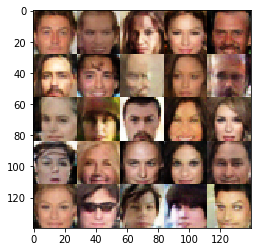

Epoch 10/10| Step 58050| Discriminator Loss:3.44163| Generator Loss:0.06060| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58100| Discriminator Loss:4.67719| Generator Loss:0.01303| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58150| Discriminator Loss:1.05098| Generator Loss:0.57143| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58200| Discriminator Loss:0.46946| Generator Loss:1.39646| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58250| Discriminator Loss:0.25645| Generator Loss:1.78451| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58300| Discriminator Loss:1.87881| Generator Loss:0.22190| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58350| Discriminator Loss:3.00140| Generator Loss:0.08638| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58400| Discriminator Loss:0.93735| Generator Loss:0.65926| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58450| Discriminator Loss:0.65656| Generator

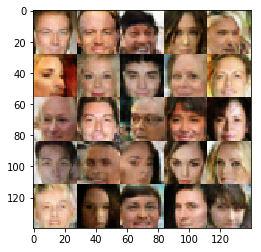

Epoch 10/10| Step 58550| Discriminator Loss:0.48693| Generator Loss:1.22102| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58600| Discriminator Loss:0.02902| Generator Loss:4.36345| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58650| Discriminator Loss:0.22851| Generator Loss:1.86290| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58700| Discriminator Loss:0.99936| Generator Loss:1.02350| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58750| Discriminator Loss:1.24452| Generator Loss:0.38458| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58800| Discriminator Loss:1.94357| Generator Loss:0.21255| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58850| Discriminator Loss:0.74010| Generator Loss:0.88714| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 58900| Discriminator Loss:0.95515| Generator Loss:0.60059| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 58950| Discriminator Loss:1.61516| Genera

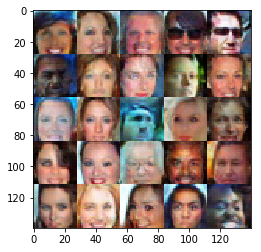

Epoch 10/10| Step 59050| Discriminator Loss:2.16527| Generator Loss:0.23979| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59100| Discriminator Loss:0.77827| Generator Loss:0.87814| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 59150| Discriminator Loss:0.10719| Generator Loss:2.96520| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 59200| Discriminator Loss:2.11806| Generator Loss:0.20164| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59250| Discriminator Loss:1.21241| Generator Loss:0.42837| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59300| Discriminator Loss:3.54882| Generator Loss:0.07820| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59350| Discriminator Loss:1.28496| Generator Loss:0.41659| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59400| Discriminator Loss:2.70286| Generator Loss:0.08989| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59450| Discriminator Loss:0.66965| Generator

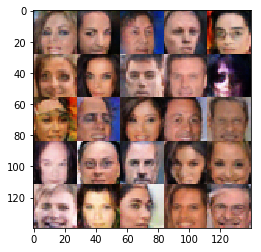

Epoch 10/10| Step 59550| Discriminator Loss:2.64171| Generator Loss:0.10138| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59600| Discriminator Loss:0.69327| Generator Loss:3.89971| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 59650| Discriminator Loss:0.17548| Generator Loss:2.32973| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 59700| Discriminator Loss:2.74441| Generator Loss:0.08714| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59750| Discriminator Loss:0.74213| Generator Loss:0.82106| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 59800| Discriminator Loss:1.48631| Generator Loss:0.32638| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59850| Discriminator Loss:1.87244| Generator Loss:0.21063| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 59900| Discriminator Loss:0.33097| Generator Loss:1.74371| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 59950| Discriminator Loss:0.26280| Generat

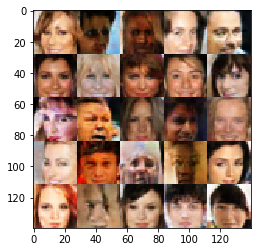

Epoch 10/10| Step 60050| Discriminator Loss:0.63392| Generator Loss:0.98916| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 60100| Discriminator Loss:1.62171| Generator Loss:0.26585| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60150| Discriminator Loss:0.97012| Generator Loss:0.57216| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60200| Discriminator Loss:1.80024| Generator Loss:0.25969| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60250| Discriminator Loss:1.25966| Generator Loss:0.45164| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60300| Discriminator Loss:0.79787| Generator Loss:0.74369| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60350| Discriminator Loss:0.60704| Generator Loss:1.04554| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 60400| Discriminator Loss:0.97505| Generator Loss:0.65214| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60450| Discriminator Loss:0.92059| Generator

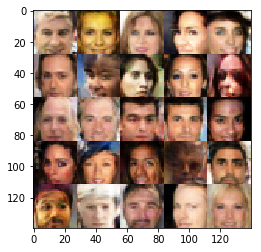

Epoch 10/10| Step 60550| Discriminator Loss:1.05110| Generator Loss:0.49326| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60600| Discriminator Loss:0.20542| Generator Loss:6.71470| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 60650| Discriminator Loss:1.95984| Generator Loss:0.18668| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60700| Discriminator Loss:0.68361| Generator Loss:0.96343| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 60750| Discriminator Loss:1.39902| Generator Loss:0.38745| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60800| Discriminator Loss:1.01565| Generator Loss:0.51943| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60850| Discriminator Loss:0.98605| Generator Loss:0.71752| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60900| Discriminator Loss:1.69118| Generator Loss:0.29233| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 60950| Discriminator Loss:0.39890| Generator

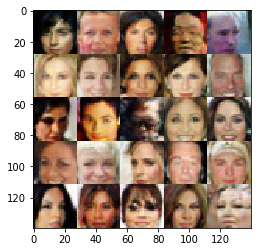

Epoch 10/10| Step 61050| Discriminator Loss:1.37506| Generator Loss:0.41479| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61100| Discriminator Loss:0.46795| Generator Loss:2.53338| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61150| Discriminator Loss:0.73468| Generator Loss:0.94128| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61200| Discriminator Loss:1.56956| Generator Loss:0.32346| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61250| Discriminator Loss:2.83737| Generator Loss:0.09725| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61300| Discriminator Loss:1.64432| Generator Loss:0.29403| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61350| Discriminator Loss:1.96123| Generator Loss:0.20052| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61400| Discriminator Loss:0.29635| Generator Loss:1.71916| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61450| Discriminator Loss:1.59129| Generato

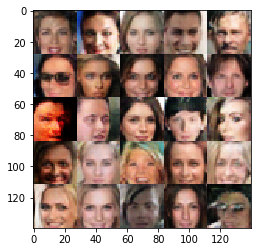

Epoch 10/10| Step 61550| Discriminator Loss:1.33355| Generator Loss:4.40348| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61600| Discriminator Loss:0.09290| Generator Loss:2.86434| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61650| Discriminator Loss:0.14559| Generator Loss:3.33750| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61700| Discriminator Loss:1.88119| Generator Loss:0.24819| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61750| Discriminator Loss:1.94799| Generator Loss:0.19874| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 61800| Discriminator Loss:0.83786| Generator Loss:0.94484| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61850| Discriminator Loss:0.28952| Generator Loss:1.77718| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61900| Discriminator Loss:0.59801| Generator Loss:1.32167| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 61950| Discriminator Loss:1.92373| Gener

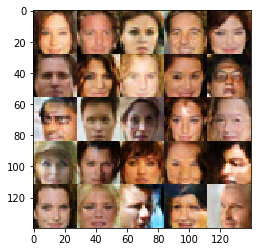

Epoch 10/10| Step 62050| Discriminator Loss:2.47009| Generator Loss:0.22582| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62100| Discriminator Loss:1.23518| Generator Loss:0.47985| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62150| Discriminator Loss:3.09727| Generator Loss:0.07212| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62200| Discriminator Loss:0.55368| Generator Loss:0.97168| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62250| Discriminator Loss:3.08221| Generator Loss:6.28702| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62300| Discriminator Loss:0.05006| Generator Loss:4.11106| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62350| Discriminator Loss:0.49629| Generator Loss:1.15336| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62400| Discriminator Loss:1.49545| Generator Loss:0.31537| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62450| Discriminator Loss:1.02102| Generat

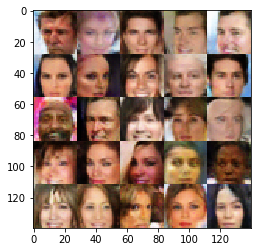

Epoch 10/10| Step 62550| Discriminator Loss:0.99072| Generator Loss:0.69014| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62600| Discriminator Loss:1.49199| Generator Loss:0.43108| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62650| Discriminator Loss:10.00604| Generator Loss:0.00009| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62700| Discriminator Loss:1.86276| Generator Loss:0.28585| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62750| Discriminator Loss:0.35713| Generator Loss:1.89916| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62800| Discriminator Loss:1.93036| Generator Loss:0.19436| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 62850| Discriminator Loss:0.61813| Generator Loss:1.15089| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62900| Discriminator Loss:0.58893| Generator Loss:1.17030| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 62950| Discriminator Loss:0.07713| Generat

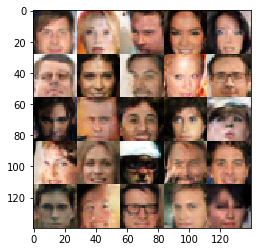

Epoch 10/10| Step 63050| Discriminator Loss:1.11386| Generator Loss:0.50551| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 63100| Discriminator Loss:0.03463| Generator Loss:6.96373| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 63150| Discriminator Loss:0.35184| Generator Loss:1.33507| Discriminator Loss>Generator Loss: False
Epoch 10/10| Step 63200| Discriminator Loss:3.12162| Generator Loss:0.06564| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 63250| Discriminator Loss:1.90615| Generator Loss:0.19698| Discriminator Loss>Generator Loss: True
Epoch 10/10| Step 63300| Discriminator Loss:0.69660| Generator Loss:0.82842| Discriminator Loss>Generator Loss: False

DL1: (?, 7, 7, 512)
DL2: (?, 14, 14, 256)
DL3: (?, 28, 28, 128)
DL4: (?, 28, 28, 3)


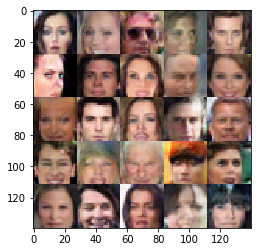

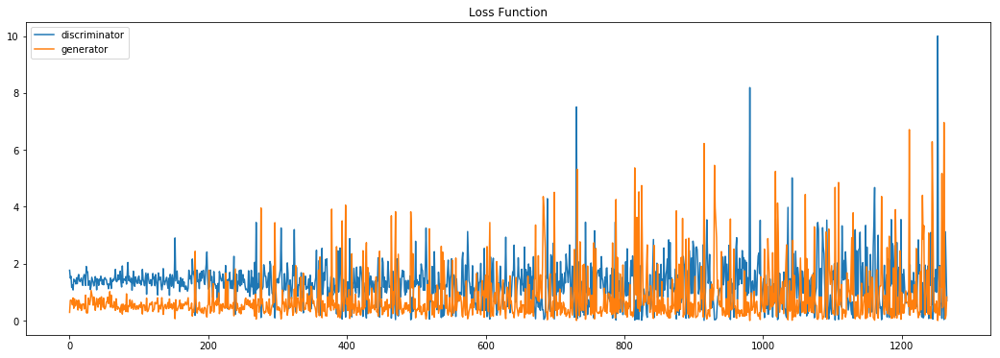

In [42]:
batch_size = 32
z_dim = 128
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.